# Quantum Control Optimization: Driven Qubit System Analysis

This notebook demonstrates the optimization of control fields for driven qubit systems using a modular quantum control framework. We use a lab-frame, two-quadrature (I/Q) drive model with Fourier-parameterized envelopes and global optimization.

## Physical System (Lab Frame, I/Q Drive)

We consider a driven qubit–cavity system with a lab-frame control applied to the qubit $\sigma_x$ operator. We express the drive uniquely via a complex envelope and an exponential carrier:

$$
\tilde{\Omega}(t) = \Omega_I(t) - i\,\Omega_Q(t), \qquad H(t) = H_0 + \operatorname{Re}\{\tilde{\Omega}(t)\, e^{i\,\omega_d t}\}\, \sigma_x.
$$

Here:
- $H_0$ is the static system Hamiltonian (cavity–qubit coupling, detunings).
- $\omega_d$ is the drive (carrier) frequency, typically near the qubit resonance.
- $\Omega_I(t),\,\Omega_Q(t)$ are real-valued I/Q control envelopes combined into the complex envelope $\tilde{\Omega}(t)$.

The envelopes are parameterized as truncated real Fourier series over a period $T$; for compactness we optimize real Fourier coefficients for each quadrature and work with the complex envelope internally.

We concatenate the I and Q coefficients into a single $2N$ vector for optimization, enabling full quadrature control and phase flexibility.

### Cost Functions and Process Perspective

- Trajectory tracking (MSE) compares the simulated observable (e.g., $\langle\sigma_+\sigma_-\rangle$) against a target function.
- Gate synthesis uses a Pauli Transfer Matrix (PTM) process cost: probe the map with a small set of input states, estimate a $3\times3$ PTM on the qubit subspace, and minimize the PTM MSE to a target unitary’s PTM. Optional penalties include leakage ($\langle a^\dagger a\rangle$) and L2 regularization.

We use QuTiP’s `mesolve` for time evolution and SciPy’s L-BFGS-B with multi-start for robust optimization.

In [1]:
# Import the modular quantum control framework
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
import importlib

# Import our modular framework components
from src import (
    # Configuration and constants
    time_array, DEFAULT_FOURIER_MODES, QUBIT_FREQUENCY, CAVITY_FREQUENCY, COUPLING_STRENGTH,
    CAVITY_DISSIPATION, QUBIT_DISSIPATION, QUBIT_DEPHASING,
    
    # Core quantum mechanics
    get_initial_state, create_operators, construct_system_hamiltonian,
    simulate_controlled_evolution,
    
    # Target functions and optimization
    generate_sinusoidal_target, generate_gaussian_target, generate_rectangular_target,
    optimize_sinusoidal_target, optimize_gaussian_target, optimize_rectangular_target,
    optimize_hadamard_gate, optimize_s_gate, optimize_t_gate,
    
    # Visualization
    QuantumControlPlotter,
)

from src.operators import get_collapse_operators

# Ensure latest dynamics code is loaded
import src.dynamics as _dyn
importlib.reload(_dyn)
from src.dynamics import simulate_controlled_evolution, compute_fourier_control_field, simulate_controlled_evolution_iq, compute_iq_control_fields
from src.utils import build_iq_vector, split_iq_vector

# Initialize plotter (disable LaTeX for portability here)
plotter = QuantumControlPlotter(show_plots=True, use_latex=False, figure_format='png')

print(f"Quantum Control Framework Initialized")
print(f"System Parameters:")
print(f"  Cavity frequency: {CAVITY_FREQUENCY/(2*np.pi):.3f} GHz")
print(f"  Qubit frequency: {QUBIT_FREQUENCY/(2*np.pi):.3f} GHz")
print(f"  Coupling strength: {COUPLING_STRENGTH/(2*np.pi):.3f} GHz")
print(f"  Evolution time: {time_array[-1]:.1f} ns")
print(f"  Fourier modes: {DEFAULT_FOURIER_MODES}")

Quantum Control Framework Initialized
System Parameters:
  Cavity frequency: 3.000 GHz
  Qubit frequency: 1.000 GHz
  Coupling strength: 0.100 GHz
  Evolution time: 10.0 ns
  Fourier modes: 32


## System Initialization and Uncontrolled Evolution

We begin by analyzing the uncontrolled system evolution from the ground state $|g,0\rangle$ (qubit ground state, cavity vacuum). This establishes our baseline for comparing controlled dynamics.

### Physical Interpretation

Without external driving ($V(t) = 0$), the system evolves under the bare Hamiltonian. The qubit-cavity interaction leads to energy exchange between the subsystems, but the overall dynamics are typically oscillatory rather than directional toward a specific target.

In [2]:
# Initialize quantum system components
initial_state = get_initial_state()
operators = create_operators()
collapse_ops = get_collapse_operators(gamma_cavity=CAVITY_DISSIPATION, # ~ 0.1-5 MHz
                                      gamma_qubit=QUBIT_DISSIPATION, # ~ 1-10 KHz
                                      gamma_dephasing=QUBIT_DEPHASING # ~ 1-20 KHz
)

print(f"Initial state: Ground state |g,0⟩")
print(f"Hilbert space dimension: {initial_state.shape[0]}")
print(f"System operators created: {len(operators)} operators")

# System parameters for dynamics simulation
system_params = {
    'omega_r': CAVITY_FREQUENCY,
    'omega_t': QUBIT_FREQUENCY,
    'coupling_g': COUPLING_STRENGTH
}

Initial state: Ground state |g,0⟩
Hilbert space dimension: 10
System operators created: 18 operators


Simulating uncontrolled system evolution...
Uncontrolled evolution completed.
Final ⟨σz⟩ value: 1.0000
Final excitation probability ⟨σ+σ-⟩: 0.0000
Evolution shows natural oscillations with Rabi frequency: 0.628 GHz


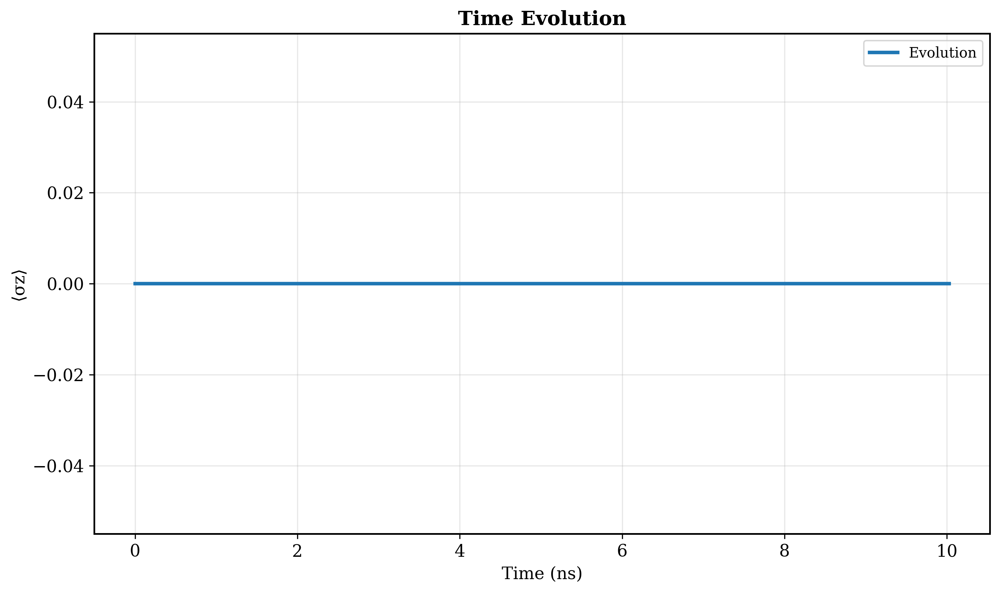

In [3]:
# Simulate uncontrolled evolution (V(t) = 0)
print("Simulating uncontrolled system evolution...")

uncontrolled_result = simulate_controlled_evolution(
    time_array,
    fourier_coefficients=np.zeros(DEFAULT_FOURIER_MODES),  # No control field
    drive_period=time_array[-1],
    system_params=system_params,
    initial_state=initial_state,
    collapse_ops=collapse_ops
)

# Extract baselines
sigma_z_uncontrolled = uncontrolled_result['expect'][0]          # ⟨σz⟩
exc_prob_uncontrolled = uncontrolled_result['expect'][-1]        # ⟨σ+σ-⟩ (excitation probability)

print(f"Uncontrolled evolution completed.")
print(f"Final ⟨σz⟩ value: {sigma_z_uncontrolled[-1]:.4f}")
print(f"Final excitation probability ⟨σ+σ-⟩: {exc_prob_uncontrolled[-1]:.4f}")
print(f"Evolution shows natural oscillations with Rabi frequency: {COUPLING_STRENGTH:.3f} GHz")

plotter.plot_time_evolution(time_array,
                            uncontrolled_result['expect'][-1], ylabel='⟨σz⟩')

Testing drive with one harmonic: index 7 (k=+1), amplitude=0.5, period=10.027 ns


No-drive:   final <a^† a> = 0.0000e+00, max = 0.0000e+00
Driven:     final <a^† a> = 1.5777e-06, max = 4.2527e-04
No-drive:   final <σ+σ-> = 0.0000e+00, max = 0.0000e+00
Driven:     final <σ+σ-> = 1.2951e-04, max = 1.4923e-01
[OK] Drive increases at least one excitation metric over baseline.


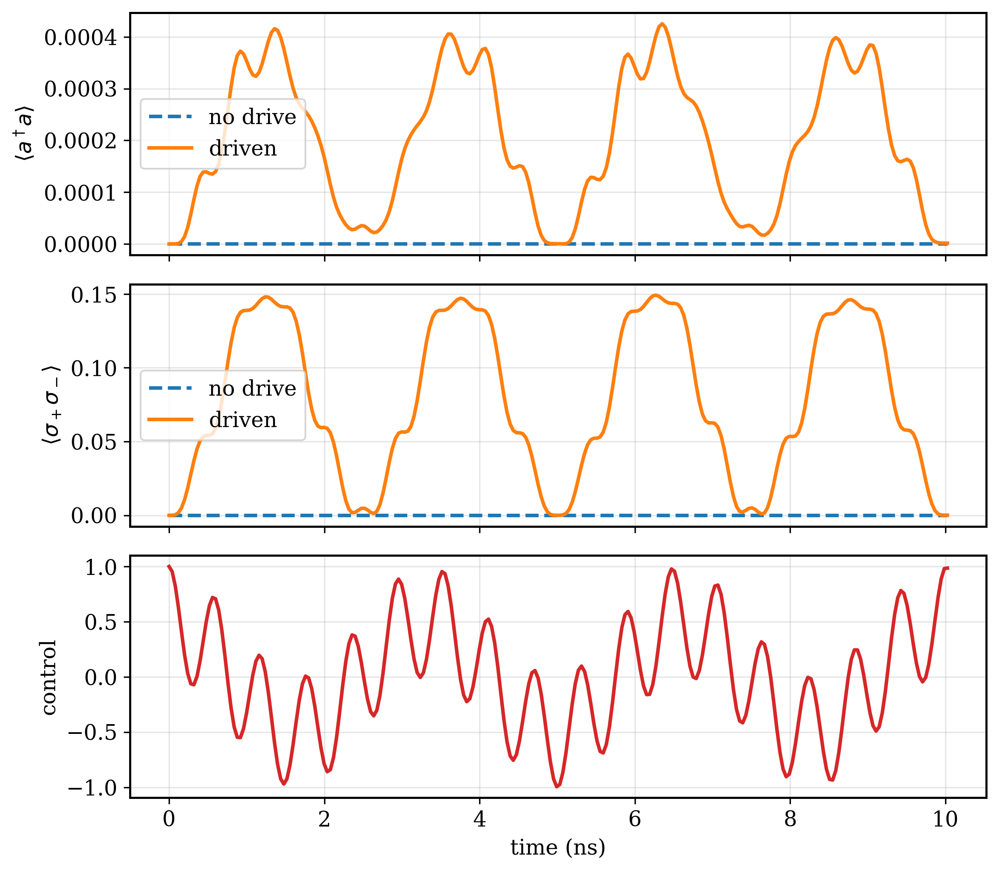

In [4]:
# Diagnostic: verify drive excites the system via number operators 
# Build measurement operators: cavity photon number and qubit excitation probability
ops = create_operators()
meas_ops = [
    ops['cavity_number'],
    ops['qubit_lowering'].dag() * ops['qubit_lowering'],
]

# Define a simple test drive: single nonzero harmonic (k=+1) with moderate amplitude
N = 12
coeffs_zero = np.zeros(N)
coeffs_test = np.zeros(N)
idx_k1 = (N // 2) + 1  # maps to k=+1 when k starts at -N//2
coeffs_test[idx_k1] = 1
period = float(time_array[-1])

print(f"Testing drive with one harmonic: index {idx_k1} (k=+1), amplitude=0.5, period={period:.3f} ns")

# Simulate without drive
sim_zero = simulate_controlled_evolution(
    time_array, coeffs_zero, period,
    system_params=system_params, initial_state=initial_state,
    measurement_ops=meas_ops,
    collapse_ops=collapse_ops
)

# Simulate with test drive
sim_drive = simulate_controlled_evolution(
    time_array, coeffs_test, period,
    system_params=system_params, initial_state=initial_state,
    measurement_ops=meas_ops,
    collapse_ops=collapse_ops
)

# Extract traces
n_cav_0 = np.asarray(sim_zero['expect'][0])   # <a^\u2020 a>
p_exc_0 = np.asarray(sim_zero['expect'][1])   # <\u03c3+\u03c3->
n_cav_1 = np.asarray(sim_drive['expect'][0])
p_exc_1 = np.asarray(sim_drive['expect'][1])

print("No-drive:   final <a^\u2020 a> = {:.4e}, max = {:.4e}".format(n_cav_0[-1], np.max(n_cav_0)))
print("Driven:     final <a^\u2020 a> = {:.4e}, max = {:.4e}".format(n_cav_1[-1], np.max(n_cav_1)))
print("No-drive:   final <\u03c3+\u03c3-> = {:.4e}, max = {:.4e}".format(p_exc_0[-1], np.max(p_exc_0)))
print("Driven:     final <\u03c3+\u03c3-> = {:.4e}, max = {:.4e}".format(p_exc_1[-1], np.max(p_exc_1)))

if (np.max(n_cav_1) <= np.max(n_cav_0)) and (np.max(p_exc_1) <= np.max(p_exc_0)):
    print("[Warning] Test drive did not increase cavity or qubit excitation over baseline.")
else:
    print("[OK] Drive increases at least one excitation metric over baseline.")

# Optional: visualize the effect and the applied control field
cf = compute_fourier_control_field(time_array, coeffs_test, period)
fig, axs = plt.subplots(3, 1, figsize=(8, 7), sharex=True)
axs[0].plot(time_array, n_cav_0, '--', label='no drive')
axs[0].plot(time_array, n_cav_1, label='driven')
axs[0].set_ylabel(r'$\langle a^\dagger a \rangle$')
axs[0].legend(); axs[0].grid(True, alpha=0.3)
axs[1].plot(time_array, p_exc_0, '--', label='no drive')
axs[1].plot(time_array, p_exc_1, label='driven')
axs[1].set_ylabel(r'$\langle \sigma_+\sigma_- \rangle$')
axs[1].legend(); axs[1].grid(True, alpha=0.3)
axs[2].plot(time_array, cf, color='tab:red')
axs[2].set_ylabel('control')
axs[2].set_xlabel('time (ns)')
axs[2].grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

## Target Functions: Physical Motivation

We consider three representative target functions that capture different aspects of quantum control:

### 1. Sinusoidal Target: $f_{\text{sin}}(t) = |\sin(\omega t)|$
- **Physical motivation**: Represents periodic population transfer between qubit states
- **Applications**: Quantum gates, coherent population oscillations
- **Challenge**: Requires precise frequency matching and phase control

### 2. Gaussian Target: $f_{\text{gauss}}(t) = \exp(-(t-t_0)^2/\sigma^2)$
- **Physical motivation**: Localized excitation resembling pulse-like dynamics
- **Applications**: Rapid state preparation, adiabatic passage
- **Challenge**: Achieving sharp temporal localization while maintaining smoothness

### 3. Rectangular Target: $f_{\text{rect}}(t) = \Theta(t-t_1)\Theta(t_2-t)$
- **Physical motivation**: Step-like population inversion or plateau states
- **Applications**: Quantum memory, persistent population inversion
- **Challenge**: Handling discontinuities with limited bandwidth control fields

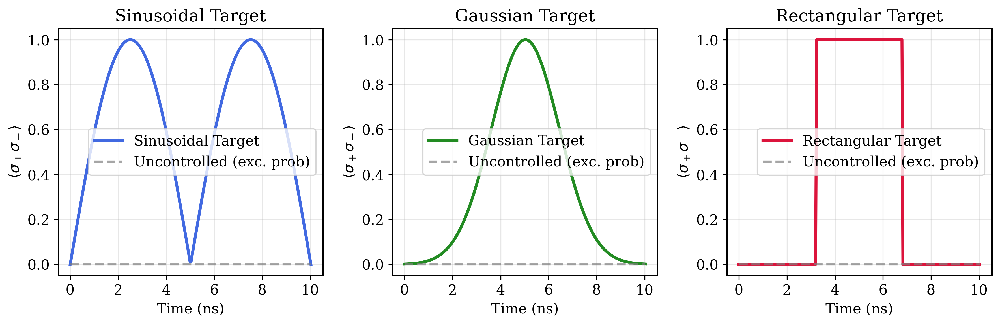

Sinusoidal: Range=[0.000, 1.000], RMS=0.706
Gaussian: Range=[0.002, 1.000], RMS=0.499
Rectangular: Range=[0.000, 1.000], RMS=0.598


In [5]:
# Generate target functions for optimization
targets = {
    'Sinusoidal': generate_sinusoidal_target(frequency_factor=2*np.pi/time_array[-1]),
    'Gaussian': generate_gaussian_target(width=2.0),
    'Rectangular': generate_rectangular_target(pulse_fraction=0.36)
}

# Visualize target functions
plt.figure(figsize=(12, 4))
colors = ['royalblue', 'forestgreen', 'crimson']

for i, (name, target) in enumerate(targets.items()):
    plt.subplot(1, 3, i+1)
    plt.plot(time_array, target, color=colors[i], linewidth=2.5, label=f'{name} Target')
    # Overlay uncontrolled excitation probability baseline for consistency with cost observable
    plt.plot(time_array, exc_prob_uncontrolled, '--', color='gray', alpha=0.7, label='Uncontrolled (exc. prob)')
    plt.xlabel('Time (ns)')
    plt.ylabel(r'$\langle \sigma_+\sigma_- \rangle$')
    plt.title(f'{name} Target')
    plt.grid(True, alpha=0.3)
    plt.legend()

plt.tight_layout()
plt.show()

results = {}

# Print target characteristics
for name, target in targets.items():
    print(f"{name}: Range=[{np.min(target):.3f}, {np.max(target):.3f}], RMS={np.sqrt(np.mean(target**2)):.3f}")

## Optimization Theory: Fourier Series Control

The control field is parameterized using a truncated Fourier series:

$$V(t) = \sum_{k=-N/2}^{N/2} c_k e^{i2\pi kt/T}$$

where $\{c_k\}$ are complex coefficients to be optimized, $T$ is the total evolution time, and $N$ is the number of Fourier modes.

### Optimization Objective

We minimize the mean-squared error cost function:

$$J[\{c_k\}] = \frac{1}{M} \sum_{i=1}^{M} |\langle\sigma_z\rangle(t_i) - f_{\text{target}}(t_i)|^2$$

This is solved using multi-start L-BFGS-B optimization to avoid local minima.

### Physical Constraints

- **Bandwidth limitation**: Finite Fourier modes restrict achievable control bandwidth
- **Amplitude bounds**: Physical limitations on drive strength
- **Causality**: Control field must be realizable in real-time

In [6]:
# Optimization Campaign - Sinusoidal Target
print("Starting optimization campaign...")

print("\n" + "="*50)
print("OPTIMIZING SINUSOIDAL TARGET")
print("="*50)

# Generate sinusoidal target (for excitation probability trace)
target_name = 'sinusoidal'
start_time = time.time()

# Optimize for sinusoidal target with L-BFGS-B
optimization_result = optimize_sinusoidal_target(
    system_params=system_params,
    frequency_factor=2*np.pi/time_array[-1],  # frequency factor for target
    fourier_modes=16,
    max_iterations=6,
    collapse_ops=collapse_ops,
    bounds=(-2, 2),
    initial_guess=None
)

optimization_time = time.time() - start_time

# Extract results
optimal_coefficients = optimization_result['optimization_result'].x
final_cost = optimization_result['optimization_result'].fun
target_evolution = optimization_result['target_evolution']
total_nfev = optimization_result['nfev']

print(f"L-BFGS-B optimization completed. Best cost: {final_cost:.6e}")
print(f"Optimization success: {optimization_result['optimization_result'].success}")
print(f"Function evaluations: {optimization_result['optimization_result'].nfev}")
print(f"Total function evaluations (nfev): {total_nfev}")

# Simulate optimized evolution
optimized_result = simulate_controlled_evolution(
    time_array, optimal_coefficients,
    optimization_result['control_period'],
    system_params=system_params,
    initial_state=initial_state,
    collapse_ops=collapse_ops
)

# Use excitation probability for sinusoidal tracking
exc_prob_optimized = optimized_result['expect'][-1]

# Store L-BFGS-B results
results[target_name] = {
    'target': target_evolution,  # Use the target from optimization result
    'optimized': exc_prob_optimized,
    'uncontrolled': exc_prob_uncontrolled,
    'coefficients': optimal_coefficients,
    'cost': final_cost,
    'time': optimization_time,
    'nfev': total_nfev,
    'method': 'L-BFGS-B'
}

print(f"L-BFGS-B Target tracking accuracy: {1-final_cost:.4f}")
print(f"L-BFGS-B Optimization completed in {optimization_time:.2f} seconds")

# Generate control fields for both methods
control_period = optimization_result['control_period']
drive_freq = float(QUBIT_FREQUENCY)

# L-BFGS-B control field
fields_lbfgs = compute_fourier_control_field(time_array, optimal_coefficients, 
                                             control_period, drive_freq)

Starting optimization campaign...

OPTIMIZING SINUSOIDAL TARGET
Starting global optimization with 6 random initializations...
Parameter space dimension: 32
Optimization method: L-BFGS-B
Variable bounds: (-2, 2)
------------------------------------------------------------
Iteration 1: Parameters = 32, Cost = 1.198632e-02
Iteration 2: Parameters = 32, Cost = 6.784547e-04
  → New best solution found!
Iteration 3: Parameters = 32, Cost = 5.747458e-03
Iteration 4: Parameters = 32, Cost = 6.784016e-04
  → New best solution found!
Iteration 5: Parameters = 32, Cost = 6.838305e-04
Iteration 6: Parameters = 32, Cost = 6.786206e-04
------------------------------------------------------------
Optimization completed. Best cost: 6.784016e-04
Optimization success: True
Function evaluations: 9735
L-BFGS-B optimization completed. Best cost: 6.784016e-04
Optimization success: True
Function evaluations: 9735
L-BFGS-B Target tracking accuracy: 0.9993
L-BFGS-B Optimization completed in 1719.19 seconds


In [ ]:
# np.savez('data/sinusoidal_optimized2.15e-3.npz', optimized_field=optimal_coefficients)
# np.savez('data/sinusoidal_optimized2.59e-2.npz', optimized_field=optimal_coefficients)
# np.savez('data/sinusoidal_optimized6.78e-4.npz', optimized_field=optimal_coefficients)

Plotting sinusoidal target optimization results...
Figure saved: results/sinusoidal_lbfgs_optimization.png


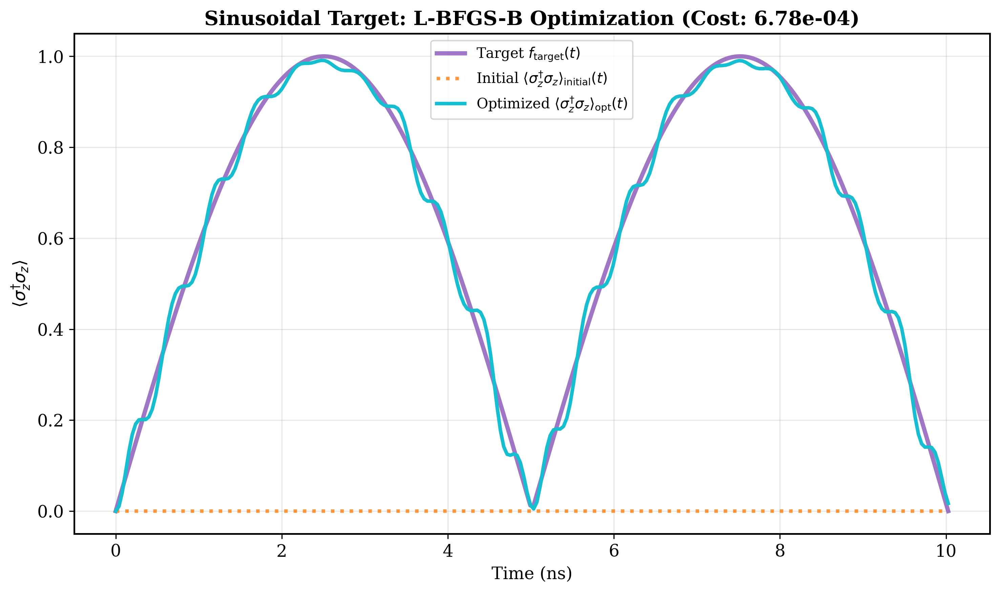

Figure saved: results/sinusoidal_lbfgs_control_field.png


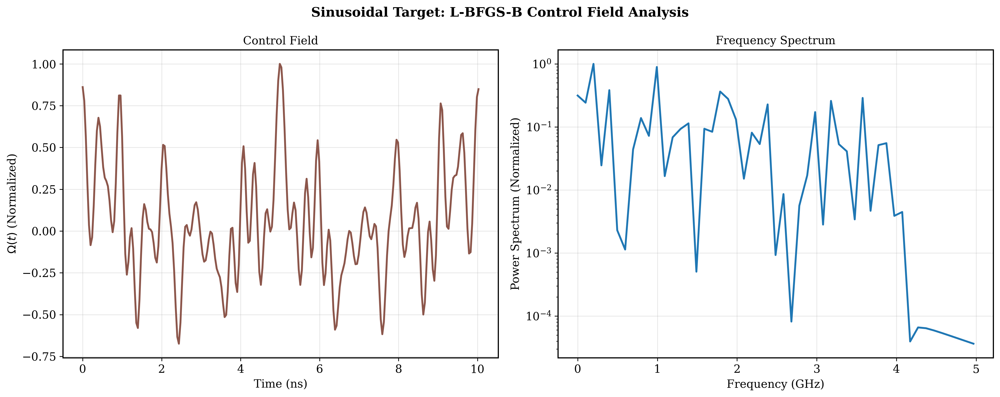

In [7]:
# Plot results for sinusoidal target
print("Plotting sinusoidal target optimization results...")

# Use existing plotter instance
optimization_plotter = plotter

# Plot optimization comparison
optimization_plotter.plot_optimization_results(
    time_points=time_array,
    initial_evolution=results['sinusoidal']['uncontrolled'],
    optimized_evolution=results['sinusoidal']['optimized'],
    target_evolution=results['sinusoidal']['target'],
    title=f'Sinusoidal Target: L-BFGS-B Optimization (Cost: {results["sinusoidal"]["cost"]:.2e})',
    filename='sinusoidal_lbfgs_optimization'
)

optimization_plotter.plot_control_field_analysis(
    time_points=time_array,
    control_field=fields_lbfgs,
    title='Sinusoidal Target: L-BFGS-B Control Field Analysis',
    filename='sinusoidal_lbfgs_control_field'
)


In [8]:
# Now run with Nelder-Mead for comparison
print("\n--- Running Nelder-Mead comparison ---")
start_time_nm = time.time()

target_name = 'sinusoidal'

# Run Nelder-Mead optimization
optimization_result_nm = optimize_sinusoidal_target(
    system_params=system_params,
    frequency_factor=2*np.pi/time_array[-1],
    fourier_modes=16,
    max_iterations=6,
    optimization_method='Nelder-Mead',
    bounds=(-2, 2),
    collapse_ops=collapse_ops,
    initial_guess=None
)

optimization_time_nm = time.time() - start_time_nm

# Simulate Nelder-Mead optimized evolution
optimal_coefficients_nm = optimization_result_nm['optimization_result'].x
final_cost_nm = optimization_result_nm['optimization_result'].fun
target_evolution_nm = optimization_result_nm['target_evolution']
total_nfev_nm = optimization_result_nm['nfev']

print(f"Nelder-Mead optimization completed. Best cost: {final_cost_nm:.6e}")
print(f"Optimization success: {optimization_result_nm['optimization_result'].success}")
print(f"Function evaluations: {optimization_result_nm['optimization_result'].nfev}")
print(f"Total function evaluations (nfev): {total_nfev_nm}")

optimized_result_nm =  simulate_controlled_evolution(
    time_array, optimal_coefficients_nm,
    optimization_result_nm['control_period'],
    system_params=system_params,
    initial_state=initial_state,
    collapse_ops=collapse_ops
)

# Use excitation probability for sinusoidal tracking
exc_prob_optimized_nm = optimized_result_nm['expect'][-1]

# Store Nelder-Mead results
results[target_name + '_nm'] = {
    'target': target_evolution_nm,
    'optimized': exc_prob_optimized_nm,
    'uncontrolled': exc_prob_uncontrolled,
    'coefficients': optimal_coefficients_nm,
    'cost': final_cost_nm,
    'time': optimization_time_nm,
    'nfev': total_nfev_nm,
    'method': 'Nelder-Mead'
}

print(f"Nelder-Mead Target tracking accuracy: {1 - final_cost_nm:.4f}")
print(f"Nelder-Mead Optimization completed in {optimization_time_nm:.2f} seconds")

control_period = optimization_result_nm['control_period']
drive_freq = float(QUBIT_FREQUENCY)

# Nelder-Mead control field  
fields_nm = compute_fourier_control_field(time_array, optimal_coefficients_nm, 
                                          control_period, drive_freq)


--- Running Nelder-Mead comparison ---
Starting global optimization with 6 random initializations...
Parameter space dimension: 32
Optimization method: Nelder-Mead
Variable bounds: (-2, 2)
------------------------------------------------------------
Iteration 1: Parameters = 32, Cost = 2.424160e-03
Iteration 2: Parameters = 32, Cost = 2.249110e-02
Iteration 3: Parameters = 32, Cost = 2.136501e-02
Iteration 4: Parameters = 32, Cost = 1.325949e-03
  → New best solution found!
Iteration 5: Parameters = 32, Cost = 1.534144e-03
Iteration 6: Parameters = 32, Cost = 4.361869e-03
------------------------------------------------------------
Optimization completed. Best cost: 1.325949e-03
Optimization success: False
Function evaluations: 6400
Nelder-Mead optimization completed. Best cost: 1.325949e-03
Optimization success: False
Function evaluations: 6400
Total function evaluations (nfev): 38400
Nelder-Mead Target tracking accuracy: 0.9987
Nelder-Mead Optimization completed in 1097.06 seconds


Plotting sinusoidal target optimization results...
Figure saved: results/sinusoidal_nm_optimization.png


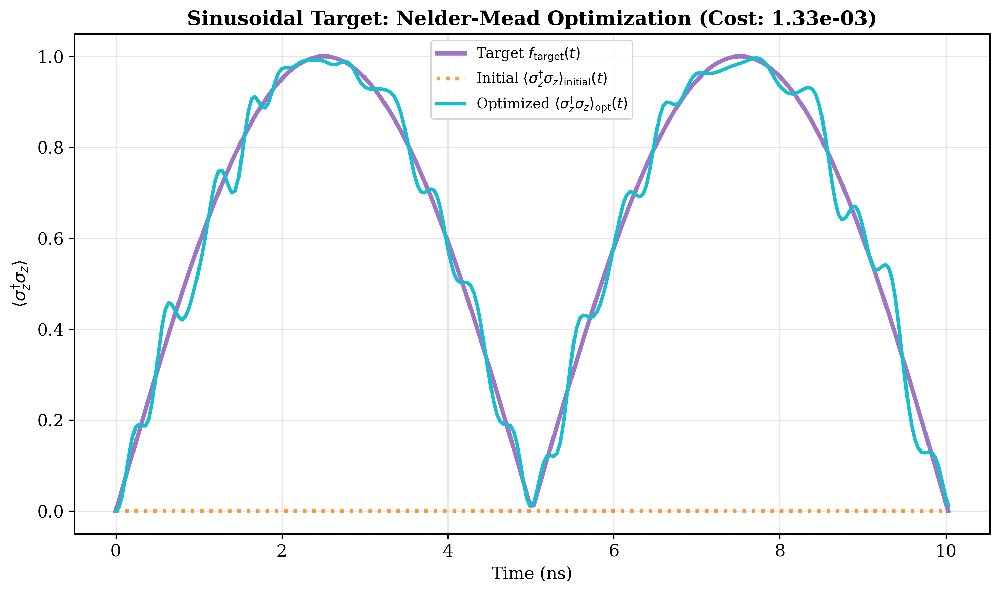

Figure saved: results/sinusoidal_nm_control_field.png


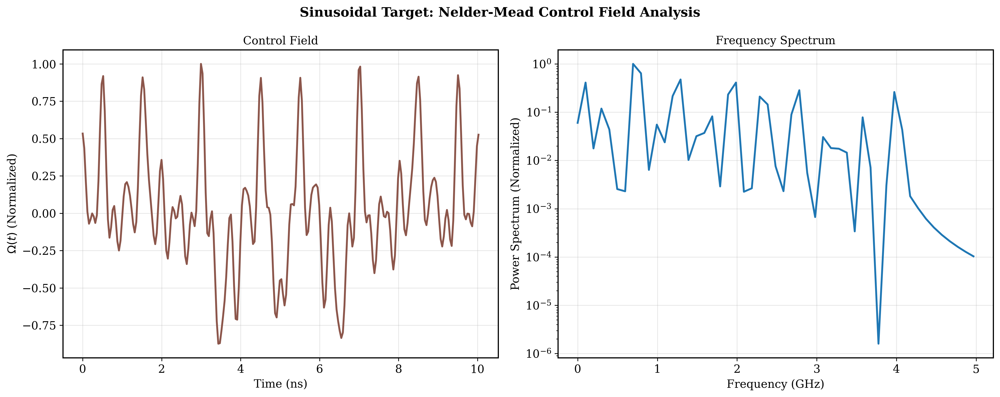

In [10]:
# Plot results for sinusoidal target
print("Plotting sinusoidal target optimization results...")

# Use existing plotter instance
optimization_plotter = plotter

# Plot Nelder-Mead optimization results
optimization_plotter.plot_optimization_results(
    time_points=time_array,
    initial_evolution=results['sinusoidal_nm']['uncontrolled'],
    optimized_evolution=results['sinusoidal_nm']['optimized'],
    target_evolution=results['sinusoidal_nm']['target'],
    title=f'Sinusoidal Target: Nelder-Mead Optimization (Cost: {results["sinusoidal_nm"]["cost"]:.2e})',
    filename='sinusoidal_nm_optimization'
)

# Plot control field analysis for Nelder-Mead
optimization_plotter.plot_control_field_analysis(
    time_points=time_array,
    control_field=fields_nm,
    title='Sinusoidal Target: Nelder-Mead Control Field Analysis',
    filename='sinusoidal_nm_control_field'
)

In [45]:
initial_guess_sinusoidal = np.load('data/sinusoidal_prediction.npz')['prediction_physical'][0]
initial_guess_sinusoidal.shape

(32,)

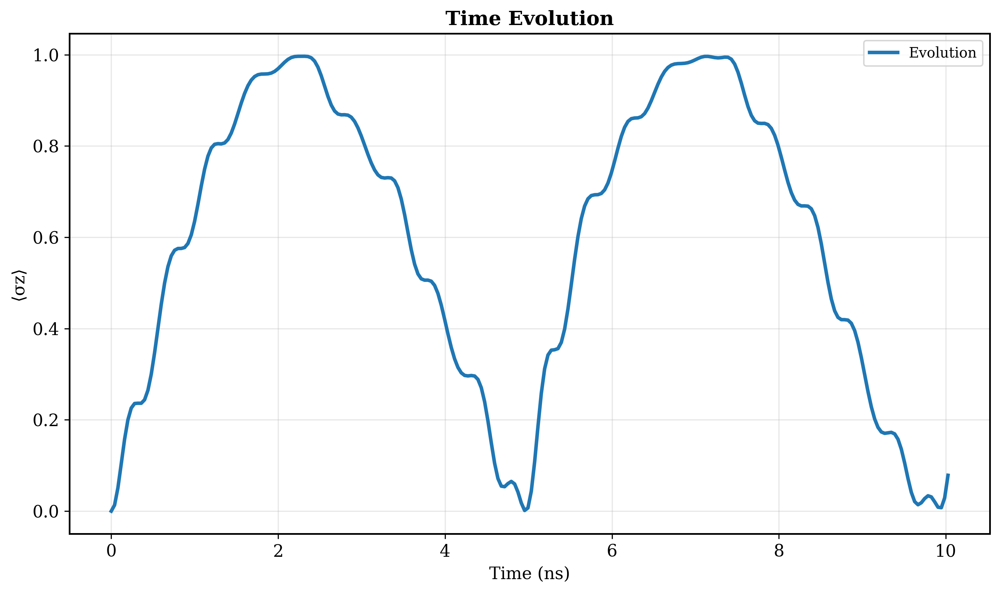

In [46]:
f = 1.0

guess_result = simulate_controlled_evolution(
    time_array, f*initial_guess_sinusoidal,
    time_array[-1],
    system_params=system_params,
    initial_state=initial_state,
    collapse_ops=collapse_ops
)

plotter_guess = QuantumControlPlotter(show_plots=True, use_latex=False, figure_format='png')

plotter_guess.plot_time_evolution(time_array,
                            guess_result['expect'][-1], ylabel='⟨σz⟩')


In [47]:
# Generate sinusoidal target (for excitation probability trace)
target_name = 'sinusoidal'
start_time = time.time()

# Optimize for sinusoidal target with L-BFGS-B and Neural Network initial guess
optimization_result_NN = optimize_sinusoidal_target(
    system_params=system_params,
    frequency_factor=2*np.pi/time_array[-1],  # frequency factor for target
    fourier_modes=16,
    max_iterations=6,
    collapse_ops=collapse_ops,
    bounds=(-2, 2),
    initial_guess=initial_guess_sinusoidal
)

optimization_time = time.time() - start_time

# Extract results
optimal_coefficients_NN = optimization_result_NN['optimization_result'].x
final_cost_NN = optimization_result_NN['optimization_result'].fun
target_evolution_NN = optimization_result_NN['target_evolution']
total_nfev_NN = optimization_result_NN['nfev']

print(f"L-BFGS-B_NN optimization completed. Best cost: {final_cost_NN:.6e}")
print(f"Optimization success: {optimization_result_NN['optimization_result'].success}")
print(f"Function evaluations: {optimization_result_NN['optimization_result'].nfev}")
print(f"Total function evaluations (nfev): {total_nfev_NN}")

# Simulate optimized evolution
optimized_result_NN = simulate_controlled_evolution(
    time_array, optimal_coefficients_NN,
    optimization_result_NN['control_period'],
    system_params=system_params,
    initial_state=initial_state,
    collapse_ops=collapse_ops
)

# Use excitation probability for sinusoidal tracking
exc_prob_optimized_NN = optimized_result_NN['expect'][-1]

# Store L-BFGS-B results with Neural Network initial guess
results[target_name + '_L-BFGS-B_NN'] = {
    'target': target_evolution_NN,  # Use the target from optimization result
    'optimized': exc_prob_optimized_NN,
    'uncontrolled': exc_prob_uncontrolled,
    'coefficients': optimal_coefficients_NN,
    'cost': final_cost_NN,
    'time': optimization_time,
    'nfev': total_nfev_NN,
    'method': 'L-BFGS-B_NN'
}

print(f"L-BFGS-B_NN Target tracking accuracy: {1-final_cost_NN:.4f}")
print(f"L-BFGS-B_NN Optimization completed in {optimization_time:.2f} seconds")

# Generate control fields for both methods
control_period = optimization_result_NN['control_period']
drive_freq = float(QUBIT_FREQUENCY)

# L-BFGS-B control field with Neural Network initial guess
fields_lbfgs_NN = compute_fourier_control_field(time_array, optimal_coefficients_NN, 
                                             control_period, drive_freq)

Starting optimization with provided initial guess...
Parameter space dimension: 32
Optimization method: L-BFGS-B
Variable bounds: (-2, 2)
------------------------------------------------------------
Cost = 6.784729e-04
------------------------------------------------------------
Optimization completed. Best cost: 6.784729e-04
Optimization success: True
Function evaluations: 2574
L-BFGS-B_NN optimization completed. Best cost: 6.784729e-04
Optimization success: True
Function evaluations: 2574
Total function evaluations (nfev): 2574
L-BFGS-B_NN Target tracking accuracy: 0.9993
L-BFGS-B_NN Optimization completed in 67.90 seconds


Plotting sinusoidal target optimization results...
Figure saved: results/sinusoidal_lbfgs_NN_optimization.png


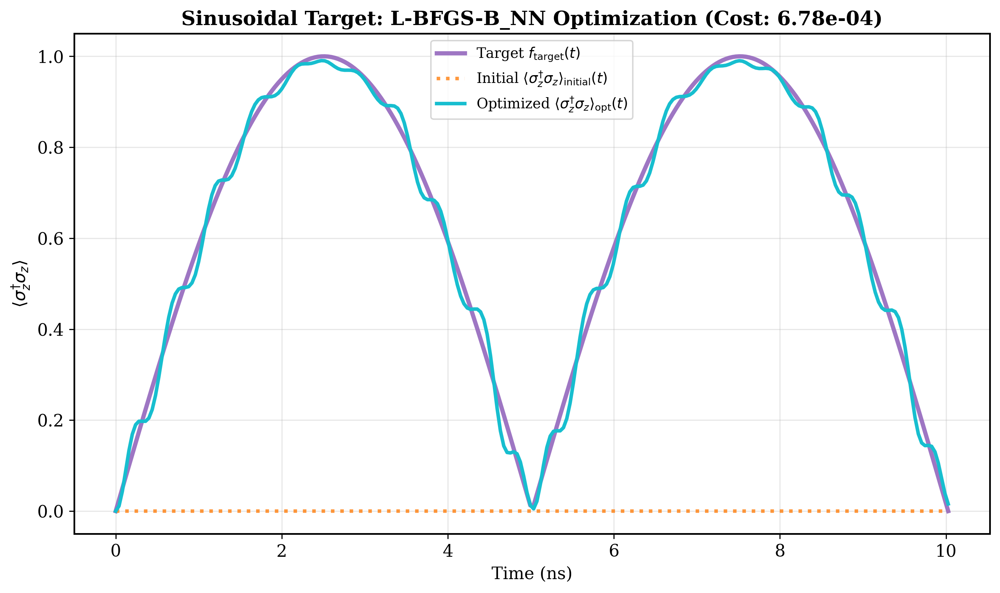

Figure saved: results/sinusoidal_lbfgs_NN_control_field.png


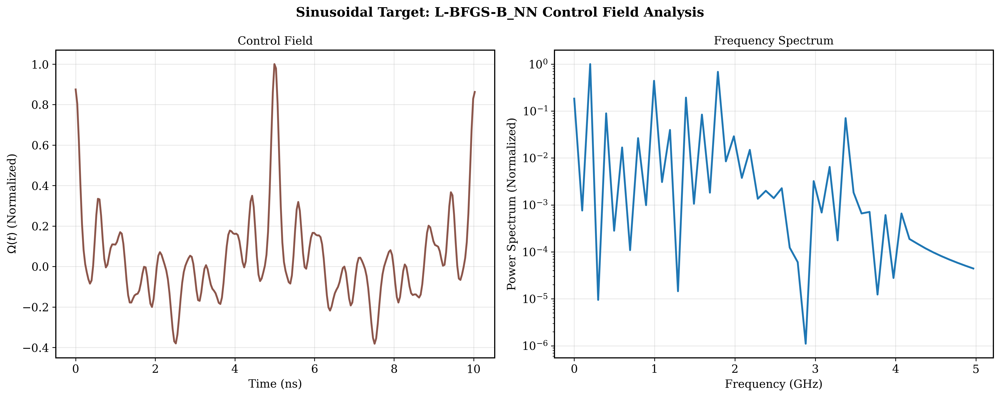

In [48]:
# Plot results for sinusoidal target
print("Plotting sinusoidal target optimization results...")

# Use existing plotter instance
optimization_plotter = plotter

# Plot optimization comparison
optimization_plotter.plot_optimization_results(
    time_points=time_array,
    initial_evolution=results['sinusoidal_L-BFGS-B_NN']['uncontrolled'],
    optimized_evolution=results['sinusoidal_L-BFGS-B_NN']['optimized'],
    target_evolution=results['sinusoidal_L-BFGS-B_NN']['target'],
    title=f'Sinusoidal Target: L-BFGS-B_NN Optimization (Cost: {results["sinusoidal_L-BFGS-B_NN"]["cost"]:.2e})',
    filename='sinusoidal_lbfgs_NN_optimization'
)

optimization_plotter.plot_control_field_analysis(
    time_points=time_array,
    control_field=fields_lbfgs_NN,
    title='Sinusoidal Target: L-BFGS-B_NN Control Field Analysis',
    filename='sinusoidal_lbfgs_NN_control_field'
)

In [49]:
# Now run with Nelder-Mead with Neural Network initial guess for comparison
print("\n--- Running Nelder-Mead with Neural Network initial guess comparison ---")
start_time_nm = time.time()

target_name = 'sinusoidal'

# Run Nelder-Mead_NN optimization
optimization_result_nm_NN = optimize_sinusoidal_target(
    system_params=system_params,
    frequency_factor=2*np.pi/time_array[-1],
    fourier_modes=16,
    max_iterations=6,
    optimization_method='Nelder-Mead',
    bounds=(-2, 2),
    collapse_ops=collapse_ops,
    initial_guess=f*initial_guess_sinusoidal
)

optimization_time_nm_NN = time.time() - start_time_nm

# Simulate Nelder-Mead_NN optimized evolution
optimal_coefficients_nm_NN = optimization_result_nm_NN['optimization_result'].x
final_cost_nm_NN = optimization_result_nm_NN['optimization_result'].fun
target_evolution_nm_NN = optimization_result_nm_NN['target_evolution']
total_nfev_nm_NN = optimization_result_nm_NN['nfev']

print(f"Nelder-Mead_NN optimization completed. Best cost: {final_cost_nm_NN:.6e}")
print(f"Optimization success: {optimization_result_nm_NN['optimization_result'].success}")
print(f"Function evaluations: {optimization_result_nm_NN['optimization_result'].nfev}")
print(f"Total function evaluations (nfev): {total_nfev_nm_NN}")

optimized_result_nm_NN =  simulate_controlled_evolution(
    time_array, optimal_coefficients_nm_NN,
    optimization_result_nm_NN['control_period'],
    system_params=system_params,
    initial_state=initial_state,
    collapse_ops=collapse_ops
)

# Use excitation probability for sinusoidal tracking
exc_prob_optimized_nm_NN = optimized_result_nm_NN['expect'][-1]

# Store Nelder-Mead results
results[target_name + '_nm_NN'] = {
    'target': target_evolution_nm_NN,
    'optimized': exc_prob_optimized_nm_NN,
    'uncontrolled': exc_prob_uncontrolled,
    'coefficients': optimal_coefficients_nm_NN,
    'cost': final_cost_nm_NN,
    'time': optimization_time_nm_NN,
    'nfev': total_nfev_nm_NN,
    'method': 'Nelder-Mead_NN'
}

print(f"Nelder-Mead_NN Target tracking accuracy: {1 - final_cost_nm_NN:.4f}")
print(f"Nelder-Mead_NN Optimization completed in {optimization_time_nm_NN:.2f} seconds")

control_period = optimization_result_nm_NN['control_period']
drive_freq = float(QUBIT_FREQUENCY)

# Nelder-Mead_NN control field  
fields_nm_NN = compute_fourier_control_field(time_array, optimal_coefficients_nm_NN, 
                                          control_period, drive_freq)


--- Running Nelder-Mead with Neural Network initial guess comparison ---
Starting optimization with provided initial guess...
Parameter space dimension: 32
Optimization method: Nelder-Mead
Variable bounds: (-2, 2)
------------------------------------------------------------
Cost = 6.914421e-04
------------------------------------------------------------
Optimization completed. Best cost: 6.914421e-04
Optimization success: False
Function evaluations: 6400
Nelder-Mead_NN optimization completed. Best cost: 6.914421e-04
Optimization success: False
Function evaluations: 6400
Total function evaluations (nfev): 6400
Nelder-Mead_NN Target tracking accuracy: 0.9993
Nelder-Mead_NN Optimization completed in 163.60 seconds


Plotting sinusoidal target optimization results...
Figure saved: results/sinusoidal_nm_nn_optimization.png


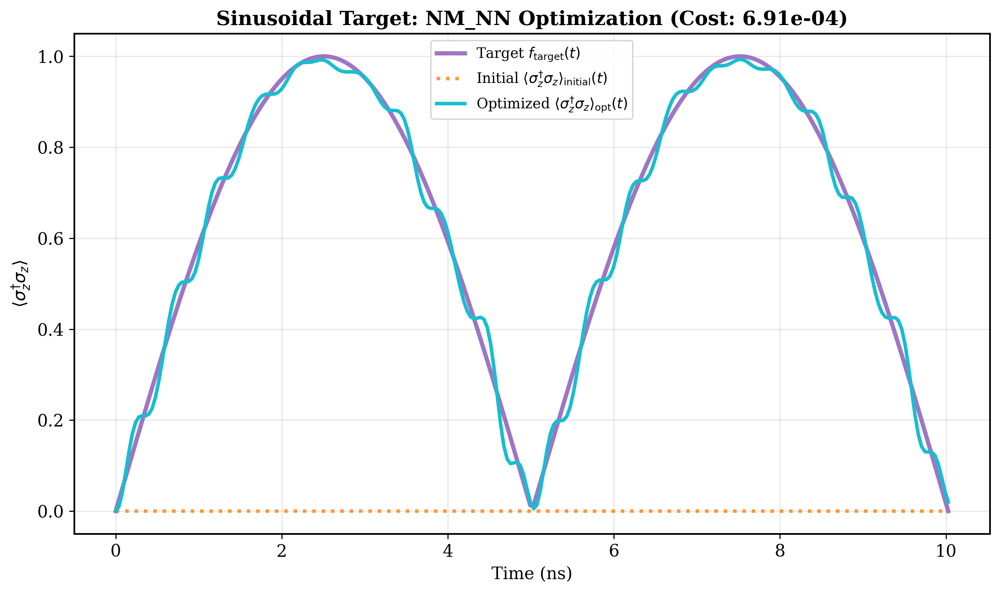

Figure saved: results/sinusoidal_nm_nn_control_field.png


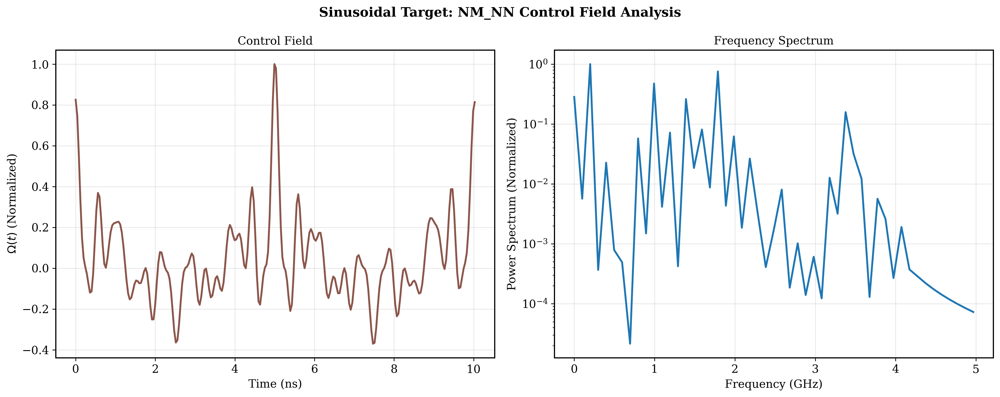

In [50]:
# Plot results for sinusoidal target
print("Plotting sinusoidal target optimization results...")

# Use existing plotter instance
optimization_plotter = plotter

# Plot optimization comparison
optimization_plotter.plot_optimization_results(
    time_points=time_array,
    initial_evolution=results['sinusoidal_nm_NN']['uncontrolled'],
    optimized_evolution=results['sinusoidal_nm_NN']['optimized'],
    target_evolution=results['sinusoidal_nm_NN']['target'],
    title=f'Sinusoidal Target: NM_NN Optimization (Cost: {results["sinusoidal_nm_NN"]["cost"]:.2e})',
    filename='sinusoidal_nm_nn_optimization'
)

optimization_plotter.plot_control_field_analysis(
    time_points=time_array,
    control_field=fields_nm_NN,
    title='Sinusoidal Target: NM_NN Control Field Analysis',
    filename='sinusoidal_nm_nn_control_field'
)

Figure saved: results/sinusoidal_method_comparison.png


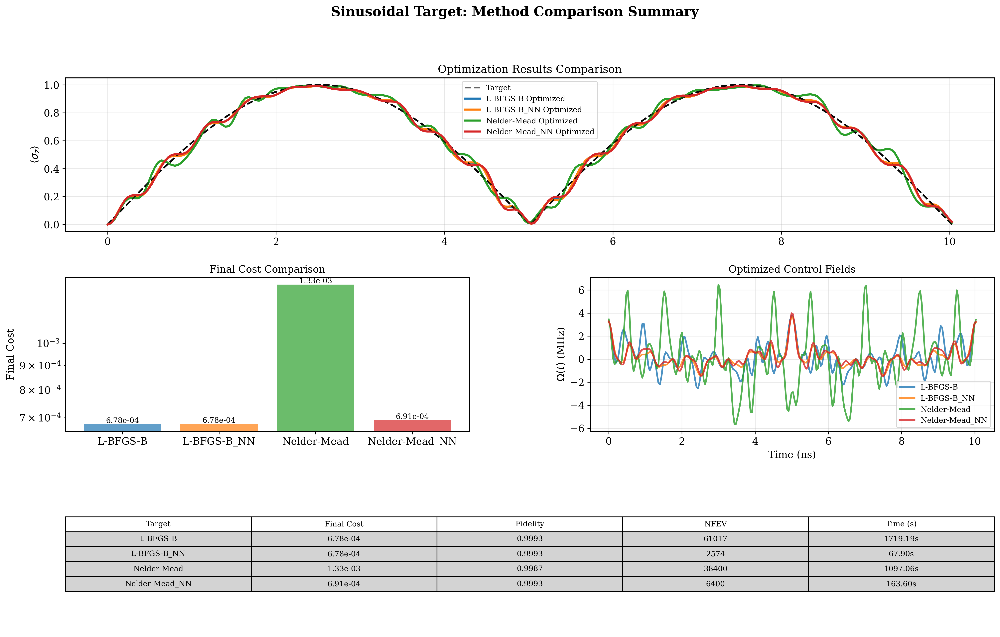


Sinusoidal Target - Method Comparison:
L-BFGS-B:    Cost = 6.784016e-04, Time = 1719.19s
Nelder-Mead: Cost = 1.325949e-03, Time = 1097.06s
Cost improvement ratio (methods): 0.51
Cost improvement ratio (L-BFGS-B with initial guess): 1.00
Cost improvement ratio (Nelder-Mead with initial guess): 0.52


In [51]:
# Method comparison visualization
sin_comparison_data = {
    'L-BFGS-B': {
        'target': results['sinusoidal']['target'],
        'optimized': results['sinusoidal']['optimized'],
        'final_cost': results['sinusoidal']['cost'],
        'optimization_time': results['sinusoidal']['time'],
        'nfev': results['sinusoidal']['nfev'],
        'control_field': fields_lbfgs
    },
    'L-BFGS-B_NN': {
        'target': results['sinusoidal_L-BFGS-B_NN']['target'],
        'optimized': results['sinusoidal_L-BFGS-B_NN']['optimized'],
        'final_cost': results['sinusoidal_L-BFGS-B_NN']['cost'],
        'optimization_time': results['sinusoidal_L-BFGS-B_NN']['time'],
        'nfev': results['sinusoidal_L-BFGS-B_NN']['nfev'],
        'control_field': fields_lbfgs_NN
    },
    'Nelder-Mead': {
        'target': results['sinusoidal_nm']['target'],
        'optimized': results['sinusoidal_nm']['optimized'],
        'final_cost': results['sinusoidal_nm']['cost'],
        'optimization_time': results['sinusoidal_nm']['time'],
        'nfev': results['sinusoidal_nm']['nfev'],
        'control_field': fields_nm
    },
    'Nelder-Mead_NN': {
        'target': results['sinusoidal_nm_NN']['target'],
        'optimized': results['sinusoidal_nm_NN']['optimized'],
        'final_cost': results['sinusoidal_nm_NN']['cost'],
        'optimization_time': results['sinusoidal_nm_NN']['time'],
        'nfev': results['sinusoidal_nm_NN']['nfev'],
        'control_field': fields_nm_NN
    }
}

optimization_plotter.create_summary_figure(
    time_points=time_array,
    results_data=sin_comparison_data,
    title='Sinusoidal Target: Method Comparison Summary',
    filename='sinusoidal_method_comparison'
)

# Print detailed comparison
print(f"\nSinusoidal Target - Method Comparison:")
print(f"L-BFGS-B:    Cost = {results['sinusoidal']['cost']:.6e}, Time = {results['sinusoidal']['time']:.2f}s")
print(f"Nelder-Mead: Cost = {results['sinusoidal_nm']['cost']:.6e}, Time = {results['sinusoidal_nm']['time']:.2f}s")
print(f"Cost improvement ratio (methods): {results['sinusoidal']['cost']/results['sinusoidal_nm']['cost']:.2f}")
print(f"Cost improvement ratio (L-BFGS-B with initial guess): {results['sinusoidal_L-BFGS-B_NN']['cost']/results['sinusoidal']['cost']:.2f}")
print(f"Cost improvement ratio (Nelder-Mead with initial guess): {results['sinusoidal_nm_NN']['cost']/results['sinusoidal_nm']['cost']:.2f}")

In [34]:
# Gaussian Target Optimization
print("\n" + "="*50)
print("OPTIMIZING GAUSSIAN TARGET")
print("="*50)

start_time = time.time()

# Optimize for Gaussian target with L-BFGS-B
gaussian_result = optimize_gaussian_target(
    system_params=system_params,
    gaussian_width=2.0,
    fourier_modes=16,
    max_iterations=6,
    collapse_ops=collapse_ops
)

optimization_time = time.time() - start_time

# Extract results
optimal_coefficients_gauss = gaussian_result['optimization_result'].x
final_cost_gauss = gaussian_result['optimization_result'].fun
target_evolution_gauss = gaussian_result['target_evolution']
total_nfev_gauss = gaussian_result['nfev']

print(f"L-BFGS-B optimization completed. Best cost: {final_cost_gauss:.6e}")
print(f"Optimization success: {gaussian_result['optimization_result'].success}")
print(f"Function evaluations: {gaussian_result['optimization_result'].nfev}")
print(f"Total function evaluations (nfev): {total_nfev_gauss}")

# Simulate optimized evolution (LBFGS)
optimized_result_gauss = simulate_controlled_evolution(
    time_array,
    fourier_coefficients=optimal_coefficients_gauss,
    drive_period=gaussian_result['control_period'],
    system_params=system_params,
    initial_state=initial_state,
    collapse_ops=collapse_ops
)

# Use excitation probability observable for Gaussian tracking
exc_prob_optimized_gauss = optimized_result_gauss['expect'][-1]

# Store L-BFGS-B results
results['gaussian'] = {
    'target': target_evolution_gauss,
    'optimized': exc_prob_optimized_gauss,
    'uncontrolled': exc_prob_uncontrolled,
    'coefficients': optimal_coefficients_gauss,
    'cost': final_cost_gauss,
    'time': optimization_time,
    'nfev': total_nfev_gauss,
    'method': 'L-BFGS-B'
}

print(f"L-BFGS-B Target tracking accuracy: {1-final_cost_gauss:.4f}")
print(f"L-BFGS-B Optimization completed in {optimization_time:.2f} seconds")

control_period_gauss = gaussian_result['control_period']
drive_freq = float(QUBIT_FREQUENCY)

# L-BFGS-B control field (include carrier frequency like sinusoidal section)
control_field_gauss_lbfgs = compute_fourier_control_field(
    time_array, optimal_coefficients_gauss, control_period_gauss, drive_freq
)


OPTIMIZING GAUSSIAN TARGET
Starting global optimization with 6 random initializations...
Parameter space dimension: 32
Optimization method: L-BFGS-B
Variable bounds: (-2.0, 2.0)
------------------------------------------------------------
Iteration 1: Parameters = 32, Cost = 9.944088e-04
Iteration 2: Parameters = 32, Cost = 1.076995e-02
Iteration 3: Parameters = 32, Cost = 1.747360e-02
Iteration 4: Parameters = 32, Cost = 3.217708e-04
  → New best solution found!
Iteration 5: Parameters = 32, Cost = 2.748718e-04
  → New best solution found!
Iteration 6: Parameters = 32, Cost = 4.866858e-04
------------------------------------------------------------
Optimization completed. Best cost: 2.748718e-04
Optimization success: True
Function evaluations: 3201
L-BFGS-B optimization completed. Best cost: 2.748718e-04
Optimization success: True
Function evaluations: 3201
Total function evaluations (nfev): 15444
L-BFGS-B Target tracking accuracy: 0.9997
L-BFGS-B Optimization completed in 422.08 sec

Plotting Gaussian target optimization results...
Figure saved: results/gaussian_lbfgs_optimization.png


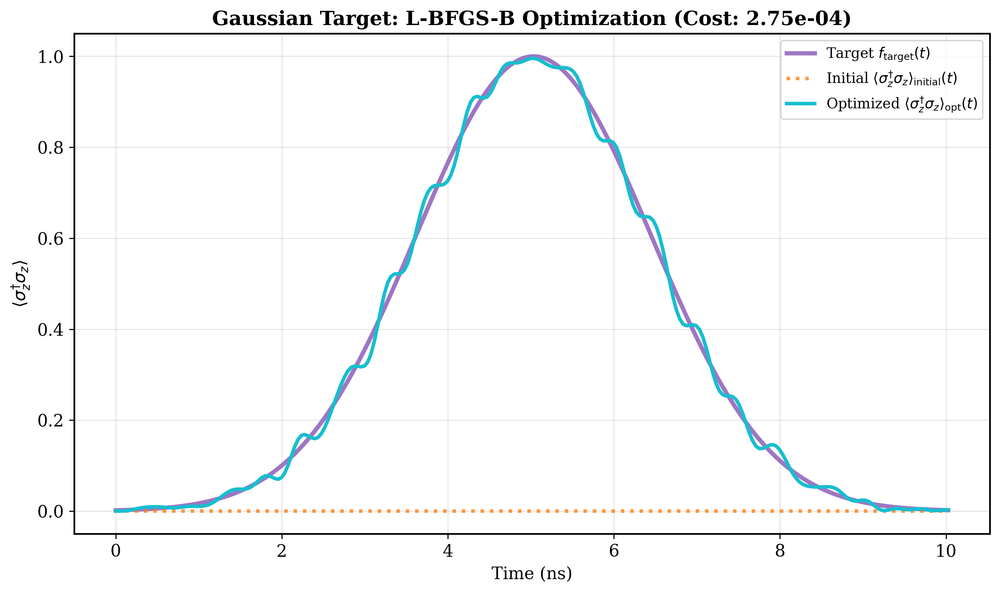

Figure saved: results/gaussian_lbfgs_control_field.png


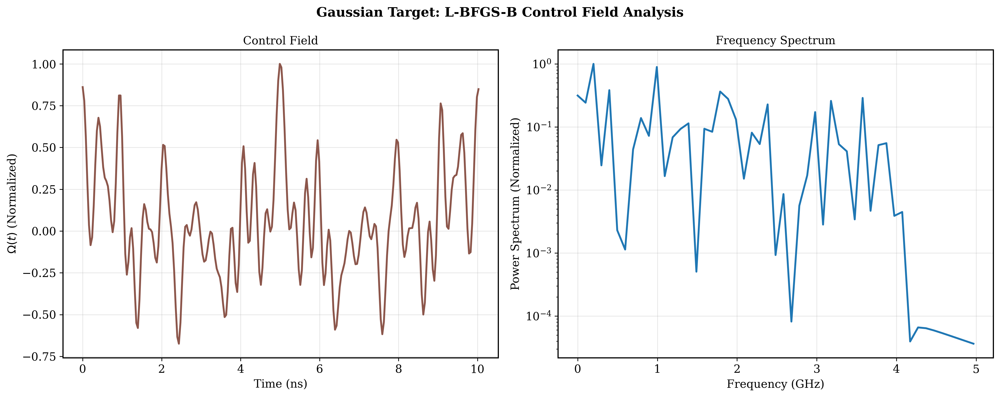

In [52]:
# Plot results for Gaussian target
print("Plotting Gaussian target optimization results...")

# Use existing plotter instance
optimization_plotter = plotter

# Plot optimization comparison
optimization_plotter.plot_optimization_results(
    time_points=time_array,
    initial_evolution=results['gaussian']['uncontrolled'],
    optimized_evolution=results['gaussian']['optimized'],
    target_evolution=results['gaussian']['target'],
    title=f'Gaussian Target: L-BFGS-B Optimization (Cost: {results["gaussian"]["cost"]:.2e})',
    filename='gaussian_lbfgs_optimization'
)

optimization_plotter.plot_control_field_analysis(
    time_points=time_array,
    control_field=fields_lbfgs,
    title='Gaussian Target: L-BFGS-B Control Field Analysis',
    filename='gaussian_lbfgs_control_field'
)


In [ ]:
# np.savez('data/gaussian_optimized2.02e-4.npz', optimized_field=optimal_coefficients_gauss)

In [53]:
initial_guess_gaussian = np.load('data/gaussian_prediction.npz')['prediction_physical'][0]
initial_guess_gaussian.shape

(32,)

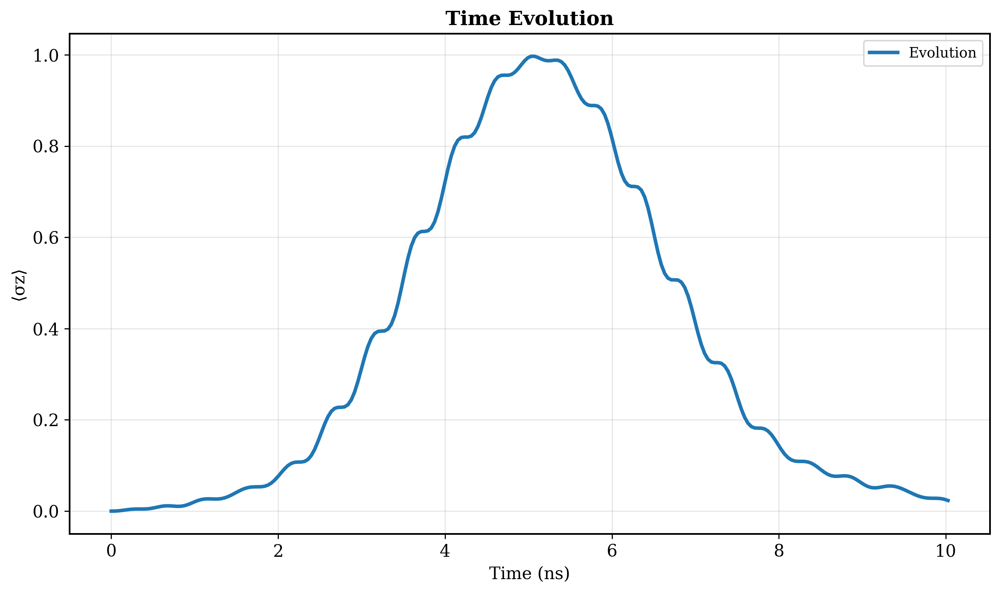

In [54]:
f = 1.0

guess_result = simulate_controlled_evolution(
    time_array, f*initial_guess_gaussian,
    time_array[-1],
    system_params=system_params,
    initial_state=initial_state,
    collapse_ops=collapse_ops
)

plotter_guess = QuantumControlPlotter(show_plots=True, use_latex=False, figure_format='png')

plotter_guess.plot_time_evolution(time_array,
                            guess_result['expect'][-1], ylabel='⟨σz⟩')


In [55]:
# Gaussian Target Optimization with Neural Network Initial Guess
start_time = time.time()

# Optimize for Gaussian target with L-BFGS-B and Neural Network initial guess
gaussian_result_NN = optimize_gaussian_target(
    system_params=system_params,
    gaussian_width=2.0,
    fourier_modes=16,
    max_iterations=6,
    collapse_ops=collapse_ops,
    initial_guess=initial_guess_gaussian
)

optimization_time_NN = time.time() - start_time

# Extract results
optimal_coefficients_gauss_NN = gaussian_result_NN['optimization_result'].x
final_cost_gauss_NN = gaussian_result_NN['optimization_result'].fun
target_evolution_gauss_NN = gaussian_result_NN['target_evolution']
total_nfev_gauss_NN = gaussian_result_NN['nfev']

print(f"L-BFGS-B_NN optimization completed. Best cost: {final_cost_gauss_NN:.6e}")
print(f"Optimization success: {gaussian_result_NN['optimization_result'].success}")
print(f"Function evaluations: {gaussian_result_NN['optimization_result'].nfev}")
print(f"Total function evaluations (nfev): {total_nfev_gauss_NN}")

# Simulate optimized evolution (LBFGS_NN)
optimized_result_gauss_NN = simulate_controlled_evolution(
    time_array,
    fourier_coefficients=optimal_coefficients_gauss_NN,
    drive_period=gaussian_result_NN['control_period'],
    system_params=system_params,
    initial_state=initial_state,
    collapse_ops=collapse_ops
)

# Use excitation probability observable for Gaussian tracking
exc_prob_optimized_gauss_NN = optimized_result_gauss_NN['expect'][-1]

# Store L-BFGS-B_NN results
results['gaussian_NN'] = {
    'target': target_evolution_gauss_NN,
    'optimized': exc_prob_optimized_gauss_NN,
    'uncontrolled': exc_prob_uncontrolled,
    'coefficients': optimal_coefficients_gauss_NN,
    'cost': final_cost_gauss_NN,
    'time': optimization_time_NN,
    'nfev': total_nfev_gauss_NN,
    'method': 'L-BFGS-B_NN'
}

print(f"L-BFGS-B_NN Target tracking accuracy: {1-final_cost_gauss_NN:.4f}")
print(f"L-BFGS-B_NN Optimization completed in {optimization_time_NN:.2f} seconds")

control_period_gauss = gaussian_result_NN['control_period']
drive_freq = float(QUBIT_FREQUENCY)

# L-BFGS-B_NN control field (include carrier frequency like sinusoidal section)
control_field_gauss_lbfgs_NN = compute_fourier_control_field(
    time_array, optimal_coefficients_gauss_NN, control_period_gauss, drive_freq
)

Starting optimization with provided initial guess...
Parameter space dimension: 32
Optimization method: L-BFGS-B
Variable bounds: (-2.0, 2.0)
------------------------------------------------------------
Cost = 2.022852e-04
------------------------------------------------------------
Optimization completed. Best cost: 2.022852e-04
Optimization success: True
Function evaluations: 1914
L-BFGS-B_NN optimization completed. Best cost: 2.022852e-04
Optimization success: True
Function evaluations: 1914
Total function evaluations (nfev): 1914
L-BFGS-B_NN Target tracking accuracy: 0.9998
L-BFGS-B_NN Optimization completed in 55.83 seconds


Plotting Gaussian target optimization results...
Figure saved: results/gaussian_lbfgs_nn_optimization.png


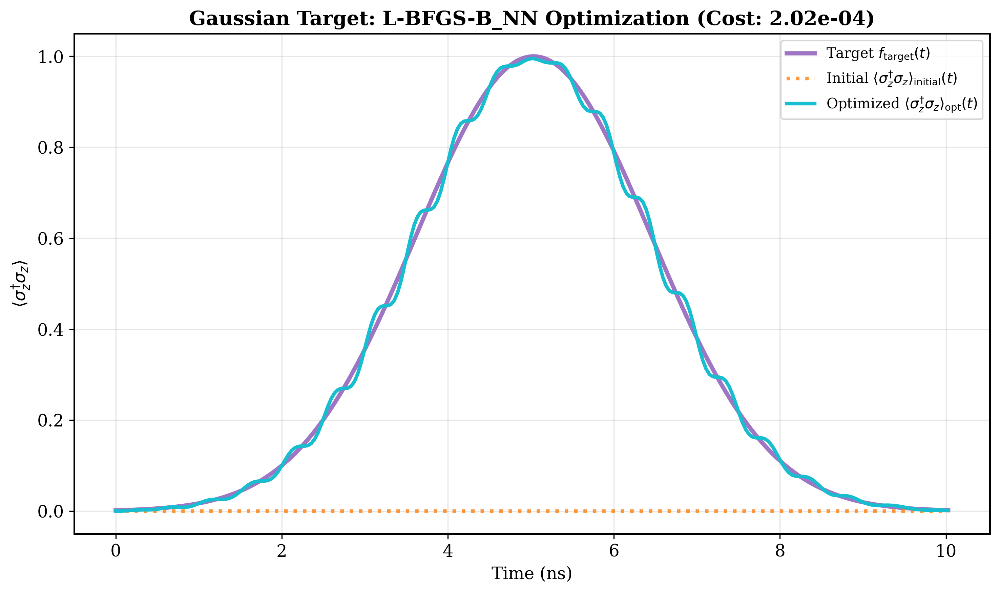

Figure saved: results/gaussian_lbfgs_nn_control_field.png


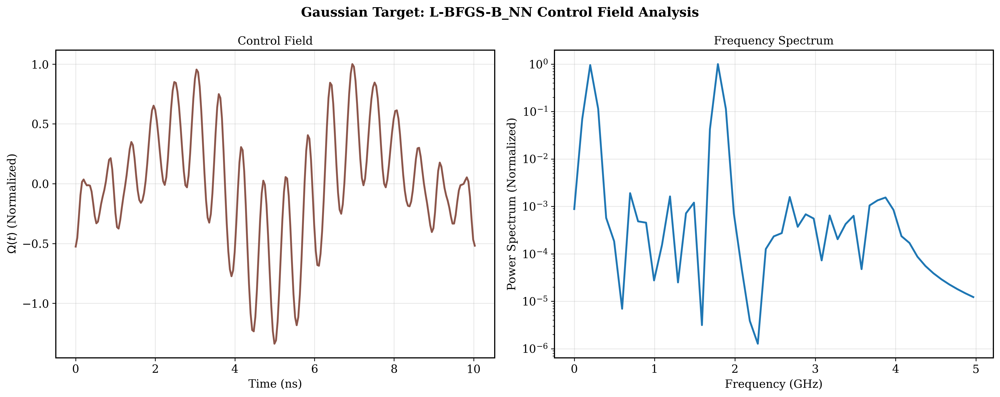

In [57]:
# Plot results for Gaussian target
print("Plotting Gaussian target optimization results...")

# Use existing plotter instance
optimization_plotter = plotter

# Plot optimization comparison
optimization_plotter.plot_optimization_results(
    time_points=time_array,
    initial_evolution=results['gaussian_NN']['uncontrolled'],
    optimized_evolution=results['gaussian_NN']['optimized'],
    target_evolution=results['gaussian_NN']['target'],
    title=f'Gaussian Target: L-BFGS-B_NN Optimization (Cost: {results["gaussian_NN"]["cost"]:.2e})',
    filename='gaussian_lbfgs_nn_optimization'
)

optimization_plotter.plot_control_field_analysis(
    time_points=time_array,
    control_field=control_field_gauss_lbfgs_NN,
    title='Gaussian Target: L-BFGS-B_NN Control Field Analysis',
    filename='gaussian_lbfgs_nn_control_field'
)


In [58]:
# Now run with Nelder-Mead for comparison (Gaussian)
print("\n--- Running Nelder-Mead comparison (Gaussian) ---")
start_time_nm = time.time()

# Run Nelder-Mead optimization
optimization_result_gauss_nm = optimize_gaussian_target(
    gaussian_width=2.0,
    fourier_modes=16,
    max_iterations=6,
    optimization_method='Nelder-Mead',
    system_params=system_params,
    collapse_ops=collapse_ops,
    initial_guess=None
)

optimization_time_gauss_nm = time.time() - start_time_nm

# Simulate Nelder-Mead optimized evolution (IQ-based, consistent with sinusoidal NM)
optimal_coefficients_gauss_nm = optimization_result_gauss_nm['optimization_result'].x
final_cost_gauss_nm = optimization_result_gauss_nm['optimization_result'].fun
target_evolution_gauss_nm = optimization_result_gauss_nm['target_evolution']
total_nfev_gauss_nm = optimization_result_gauss_nm['nfev']

print(f"Nelder-Mead optimization completed. Best cost: {final_cost_gauss_nm:.6e}")
print(f"Optimization success: {optimization_result_gauss_nm['optimization_result'].success}")
print(f"Function evaluations: {optimization_result_gauss_nm['optimization_result'].nfev}")
print(f"Total function evaluations (nfev): {total_nfev_gauss_nm}")

optimized_result_gauss_nm = simulate_controlled_evolution(
    time_array,
    fourier_coefficients=optimal_coefficients_gauss_nm,
    drive_period=optimization_result_gauss_nm['control_period'],
    system_params=system_params,
    initial_state=initial_state,
    collapse_ops=collapse_ops
)

# Use excitation probability for Gaussian tracking
exc_prob_optimized_gauss_nm = optimized_result_gauss_nm['expect'][-1]

# Store Nelder-Mead results
results['gaussian_nm'] = {
    'target': target_evolution_gauss_nm,
    'optimized': exc_prob_optimized_gauss_nm,
    'uncontrolled': exc_prob_uncontrolled,
    'coefficients': optimal_coefficients_gauss_nm,
    'cost': final_cost_gauss_nm,
    'time': optimization_time_gauss_nm,
    'nfev': total_nfev_gauss_nm,
    'method': 'Nelder-Mead',
}

print(f"Nelder-Mead Target tracking accuracy: {1 - final_cost_gauss_nm:.4f}")
print(f"Nelder-Mead Optimization completed in {optimization_time_gauss_nm:.2f} seconds")

control_period = optimization_result_gauss_nm['control_period']
drive_freq = float(QUBIT_FREQUENCY)

# Nelder-Mead control field (Gaussian)
control_field_gauss_nm = compute_fourier_control_field(
    time_array, optimal_coefficients_gauss_nm, control_period, drive_freq
)


--- Running Nelder-Mead comparison (Gaussian) ---
Starting global optimization with 6 random initializations...
Parameter space dimension: 32
Optimization method: Nelder-Mead
Variable bounds: (-2.0, 2.0)
------------------------------------------------------------
Iteration 1: Parameters = 32, Cost = 1.944562e-02
Iteration 2: Parameters = 32, Cost = 2.164208e-02
Iteration 3: Parameters = 32, Cost = 2.624267e-04
  → New best solution found!
Iteration 4: Parameters = 32, Cost = 1.962342e-02
Iteration 5: Parameters = 32, Cost = 6.116640e-04
Iteration 6: Parameters = 32, Cost = 1.631678e-02
------------------------------------------------------------
Optimization completed. Best cost: 2.624267e-04
Optimization success: False
Function evaluations: 6400
Nelder-Mead optimization completed. Best cost: 2.624267e-04
Optimization success: False
Function evaluations: 6400
Total function evaluations (nfev): 38400
Nelder-Mead Target tracking accuracy: 0.9997
Nelder-Mead Optimization completed in 10

Plotting Gaussian target optimization results...
Figure saved: results/gaussian_nm_optimization.png


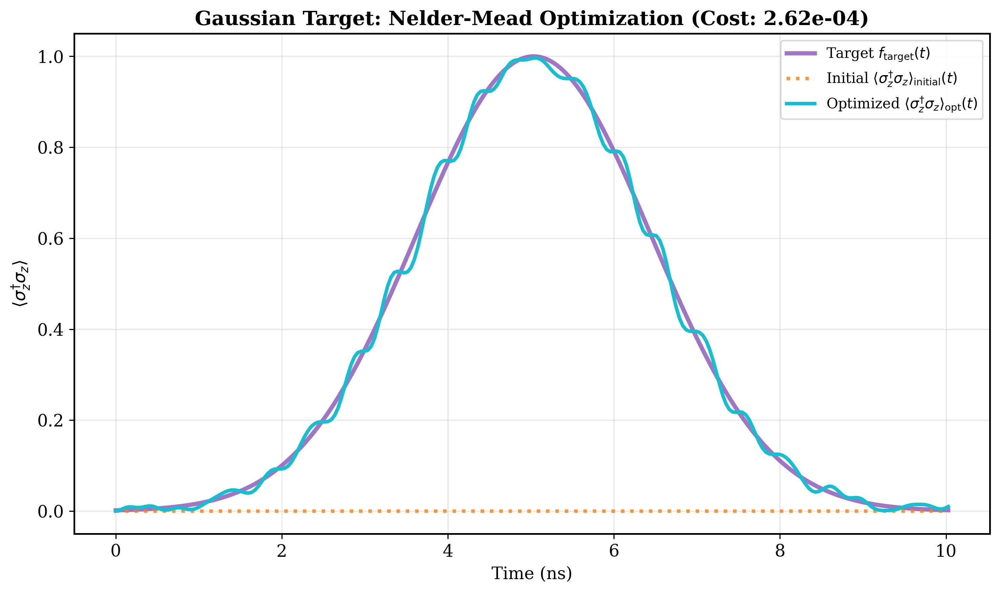

Figure saved: results/gaussian_nm_control_field.png


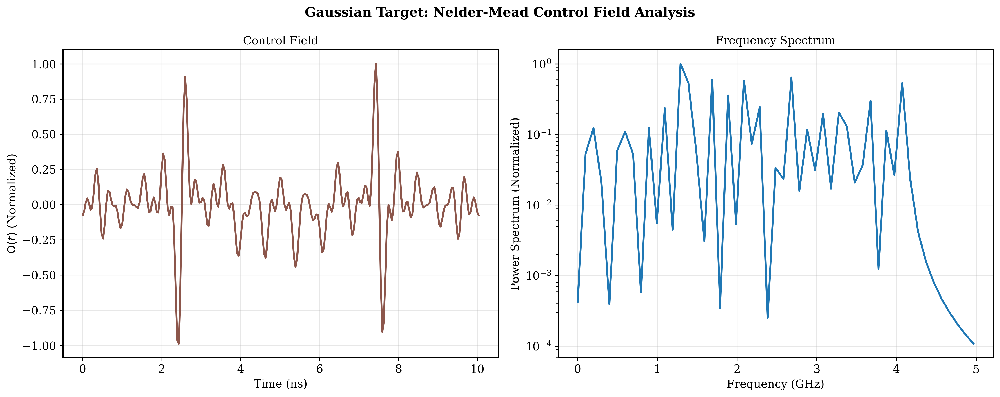

In [59]:
# Plot results for Gaussian target
print("Plotting Gaussian target optimization results...")

# Plot Nelder-Mead optimization results
optimization_plotter.plot_optimization_results(
    time_points=time_array,
    initial_evolution=results['gaussian_nm']['uncontrolled'],
    optimized_evolution=results['gaussian_nm']['optimized'],
    target_evolution=results['gaussian_nm']['target'],
    title=f'Gaussian Target: Nelder-Mead Optimization (Cost: {results["gaussian_nm"]["cost"]:.2e})',
    filename='gaussian_nm_optimization'
)

# Plot control field analysis for Nelder-Mead
optimization_plotter.plot_control_field_analysis(
    time_points=time_array,
    control_field=control_field_gauss_nm,
    title='Gaussian Target: Nelder-Mead Control Field Analysis',
    filename='gaussian_nm_control_field'
)

In [60]:
# Now run with Nelder-Mead with Neural Network initial guess for comparison (Gaussian)
print("\n--- Running Nelder-Mead_NN comparison (Gaussian) ---")
start_time_nm_NN = time.time()

# Run Nelder-Mead optimization with Neural Network initial guess
optimization_result_gauss_nm_NN = optimize_gaussian_target(
    gaussian_width=2.0,
    fourier_modes=16,
    max_iterations=6,
    optimization_method='Nelder-Mead',
    system_params=system_params,
    collapse_ops=collapse_ops,
    initial_guess=initial_guess_gaussian
)

optimization_time_gauss_nm_NN = time.time() - start_time_nm_NN

# Simulate Nelder-Mead optimized evolution (IQ-based, consistent with sinusoidal NM)
optimal_coefficients_gauss_nm_NN = optimization_result_gauss_nm_NN['optimization_result'].x
final_cost_gauss_nm_NN = optimization_result_gauss_nm_NN['optimization_result'].fun
target_evolution_gauss_nm_NN = optimization_result_gauss_nm_NN['target_evolution']
total_nfev_gauss_nm_NN = optimization_result_gauss_nm_NN['nfev']

print(f"Nelder-Mead optimization completed. Best cost: {final_cost_gauss_nm_NN:.6e}")
print(f"Optimization success: {optimization_result_gauss_nm_NN['optimization_result'].success}")
print(f"Function evaluations: {optimization_result_gauss_nm_NN['optimization_result'].nfev}")
print(f"Total function evaluations (nfev): {total_nfev_gauss_nm_NN}")

optimized_result_gauss_nm_NN = simulate_controlled_evolution(
    time_array,
    fourier_coefficients=optimal_coefficients_gauss_nm_NN,
    drive_period=optimization_result_gauss_nm_NN['control_period'],
    system_params=system_params,
    initial_state=initial_state,
    collapse_ops=collapse_ops
)

# Use excitation probability for Gaussian tracking
exc_prob_optimized_gauss_nm_NN = optimized_result_gauss_nm_NN['expect'][-1]

# Store Nelder-Mead results
results['gaussian_nm_NN'] = {
    'target': target_evolution_gauss_nm_NN,
    'optimized': exc_prob_optimized_gauss_nm_NN,
    'uncontrolled': exc_prob_uncontrolled,
    'coefficients': optimal_coefficients_gauss_nm_NN,
    'cost': final_cost_gauss_nm_NN,
    'time': optimization_time_gauss_nm_NN,
    'nfev': total_nfev_gauss_nm_NN,
    'method': 'Nelder-Mead_NN',
}

print(f"Nelder-Mead_NN Target tracking accuracy: {1 - final_cost_gauss_nm_NN:.4f}")
print(f"Nelder-Mead_NN Optimization completed in {optimization_time_gauss_nm_NN:.2f} seconds")

control_period = optimization_result_gauss_nm_NN['control_period']
drive_freq = float(QUBIT_FREQUENCY)

# Nelder-Mead control field (Gaussian)
control_field_gauss_nm_NN = compute_fourier_control_field(
    time_array, optimal_coefficients_gauss_nm_NN, control_period, drive_freq
)


--- Running Nelder-Mead_NN comparison (Gaussian) ---
Starting optimization with provided initial guess...
Parameter space dimension: 32
Optimization method: Nelder-Mead
Variable bounds: (-2.0, 2.0)
------------------------------------------------------------
Cost = 2.038000e-04
------------------------------------------------------------
Optimization completed. Best cost: 2.038000e-04
Optimization success: False
Function evaluations: 6400
Nelder-Mead optimization completed. Best cost: 2.038000e-04
Optimization success: False
Function evaluations: 6400
Total function evaluations (nfev): 6400
Nelder-Mead_NN Target tracking accuracy: 0.9998
Nelder-Mead_NN Optimization completed in 186.07 seconds


Plotting Gaussian target optimization results...
Figure saved: results/gaussian_nm_NN_optimization.png


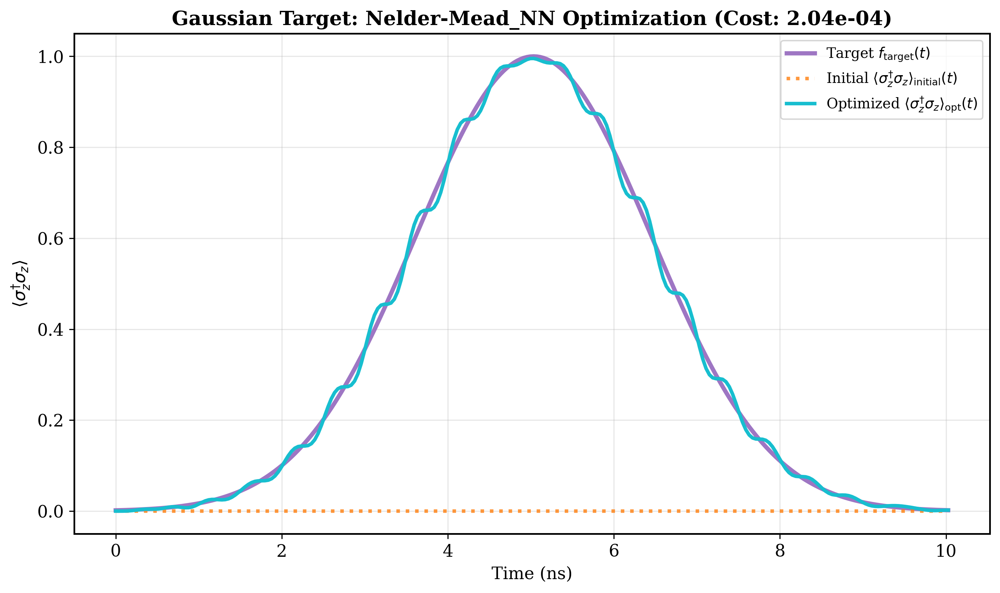

Figure saved: results/gaussian_nm_NN_control_field.png


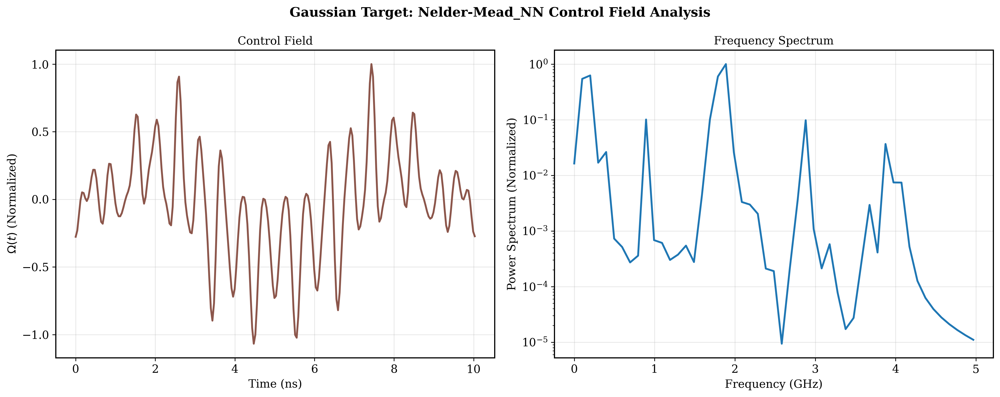

In [61]:
# Plot results for Gaussian target
print("Plotting Gaussian target optimization results...")

# Plot Nelder-Mead optimization results
optimization_plotter.plot_optimization_results(
    time_points=time_array,
    initial_evolution=results['gaussian_nm_NN']['uncontrolled'],
    optimized_evolution=results['gaussian_nm_NN']['optimized'],
    target_evolution=results['gaussian_nm_NN']['target'],
    title=f'Gaussian Target: Nelder-Mead_NN Optimization (Cost: {results["gaussian_nm_NN"]["cost"]:.2e})',
    filename='gaussian_nm_NN_optimization'
)

# Plot control field analysis for Nelder-Mead with Neural Network initial guess
optimization_plotter.plot_control_field_analysis(
    time_points=time_array,
    control_field=control_field_gauss_nm_NN,
    title='Gaussian Target: Nelder-Mead_NN Control Field Analysis',
    filename='gaussian_nm_NN_control_field'
)

Figure saved: results/gaussian_method_comparison.png


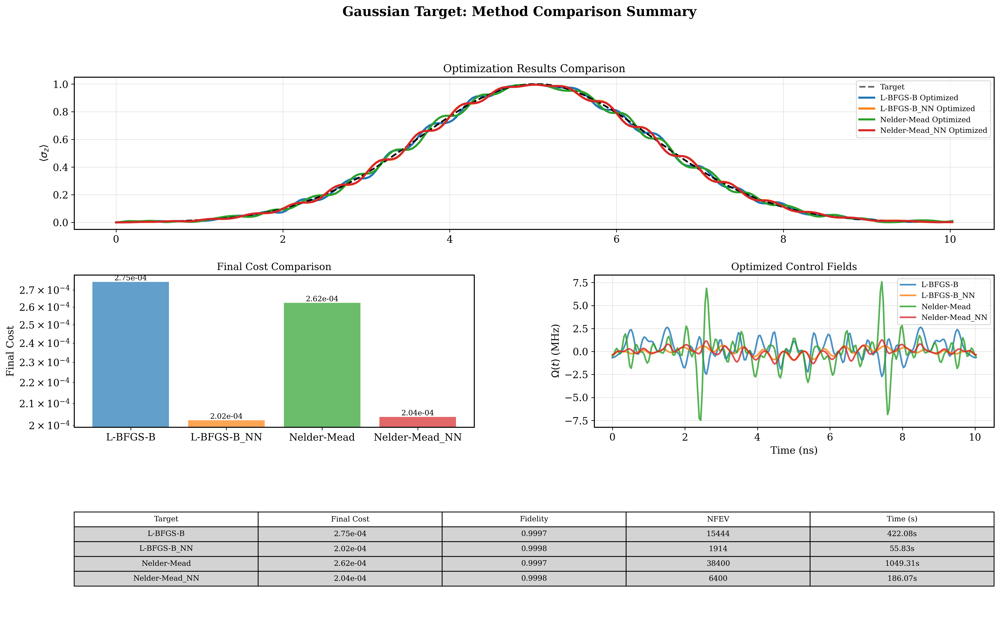

Figure saved: results/gaussian_multi_target_comparison.png


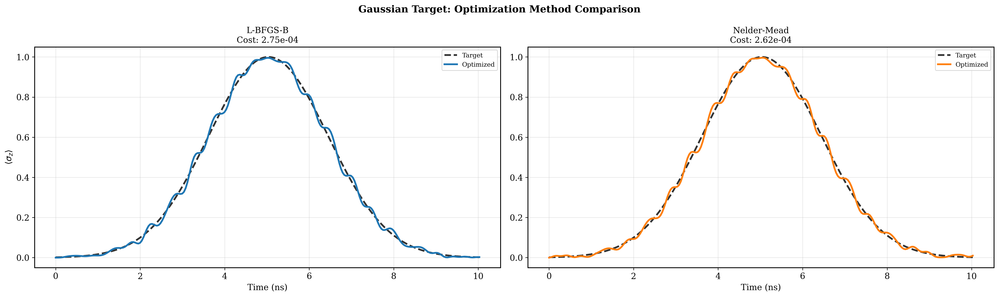


Gaussian Target - Method Comparison:
L-BFGS-B:    Cost = 2.748718e-04, Time = 422.08s
Nelder-Mead: Cost = 2.624267e-04, Time = 1049.31s
Cost improvement ratio: 1.05


In [63]:
# Gaussian Target - Method comparison summary
sinusoidal_like_gauss = {
    'L-BFGS-B': {
        'target': results['gaussian']['target'],
        'optimized': results['gaussian']['optimized'],
        'final_cost': results['gaussian']['cost'],
        'optimization_time': results['gaussian']['time'],
        'nfev': results['gaussian']['nfev'],
        'control_field': control_field_gauss_lbfgs 
    },
    'L-BFGS-B_NN': {
        'target': results['gaussian_NN']['target'],
        'optimized': results['gaussian_NN']['optimized'],
        'final_cost': results['gaussian_NN']['cost'],
        'optimization_time': results['gaussian_NN']['time'],
        'nfev': results['gaussian_NN']['nfev'],
        'control_field': control_field_gauss_lbfgs_NN 
    },
    'Nelder-Mead': {
        'target': results['gaussian_nm']['target'],
        'optimized': results['gaussian_nm']['optimized'],
        'final_cost': results['gaussian_nm']['cost'],
        'optimization_time': results['gaussian_nm']['time'],
        'nfev': results['gaussian_nm']['nfev'],
        'control_field': control_field_gauss_nm
    },
    'Nelder-Mead_NN': {
        'target': results['gaussian_nm_NN']['target'],
        'optimized': results['gaussian_nm_NN']['optimized'],
        'final_cost': results['gaussian_nm_NN']['cost'],
        'optimization_time': results['gaussian_nm_NN']['time'],
        'nfev': results['gaussian_nm_NN']['nfev'],
        'control_field': control_field_gauss_nm_NN
}
}

optimization_plotter.create_summary_figure(
    time_points=time_array,
    results_data=sinusoidal_like_gauss,
    title='Gaussian Target: Method Comparison Summary',
    filename='gaussian_method_comparison',
)

optimization_plotter.plot_multi_target_comparison(
    time_points=time_array,
    target_data={'L-BFGS-B': results['gaussian']['target'], 'Nelder-Mead': results['gaussian_nm']['target']},
    optimized_data={'L-BFGS-B': results['gaussian']['optimized'], 'Nelder-Mead': results['gaussian_nm']['optimized']},
    cost_values={'L-BFGS-B': results['gaussian']['cost'], 'Nelder-Mead': results['gaussian_nm']['cost']},
    title='Gaussian Target: Optimization Method Comparison',
    filename='gaussian_multi_target_comparison',
)

print("\nGaussian Target - Method Comparison:")
print(f"L-BFGS-B:    Cost = {results['gaussian']['cost']:.6e}, Time = {results['gaussian']['time']:.2f}s")
print(f"Nelder-Mead: Cost = {results['gaussian_nm']['cost']:.6e}, Time = {results['gaussian_nm']['time']:.2f}s")
print(f"Cost improvement ratio: {results['gaussian']['cost']/results['gaussian_nm']['cost']:.2f}")

In [64]:
# Rectangular Target Optimization  
print("\n" + "="*50)
print("OPTIMIZING RECTANGULAR TARGET")
print("="*50)

start_time = time.time()

# Optimize for Rectangular target with L-BFGS-B
rectangular_result = optimize_rectangular_target(
    system_params=system_params,
    pulse_fraction=0.35,  # 35% duty cycle
    fourier_modes=16,
    max_iterations=6,
    collapse_ops=collapse_ops,
    initial_guess=None
)

optimization_time = time.time() - start_time

# Extract results
optimal_coefficients_rect = rectangular_result['optimization_result'].x
final_cost_rect = rectangular_result['optimization_result'].fun
target_evolution_rect = rectangular_result['target_evolution']
total_nfev_rect = rectangular_result['nfev']

print(f"L-BFGS-B optimization completed. Best cost: {final_cost_rect:.6e}")
print(f"Optimization success: {rectangular_result['optimization_result'].success}")
print(f"Function evaluations: {total_nfev_rect}")
print(f"Total function evaluations (nfev): {total_nfev_rect}")

# Simulate optimized evolution (LBFGS)
optimized_result_rect = simulate_controlled_evolution(
    time_array,
    fourier_coefficients=optimal_coefficients_rect,
    drive_period=rectangular_result['control_period'],
    system_params=system_params,
    initial_state=initial_state,
    collapse_ops=collapse_ops
)

# Use excitation probability observable for Rectangular tracking
exc_prob_optimized_rect = optimized_result_rect['expect'][-1]

# Store L-BFGS-B results
results['rectangular'] = {
    'target': target_evolution_rect,
    'optimized': exc_prob_optimized_rect,
    'uncontrolled': exc_prob_uncontrolled,
    'coefficients': optimal_coefficients_rect,
    'cost': final_cost_rect,
    'time': optimization_time,
    'nfev': total_nfev_rect,
    'method': 'L-BFGS-B',
}

print(f"L-BFGS-B Target tracking accuracy: {1-final_cost_rect:.4f}")
print(f"L-BFGS-B Optimization completed in {optimization_time:.2f} seconds")

control_period_rect = rectangular_result['control_period']
drive_freq = float(QUBIT_FREQUENCY)

# Include drive frequency for consistency with sinusoidal section
control_field_rect_lbfgs = compute_fourier_control_field(
    time_array, optimal_coefficients_rect, control_period_rect, drive_freq
)


OPTIMIZING RECTANGULAR TARGET
Starting global optimization with 6 random initializations...
Parameter space dimension: 32
Optimization method: L-BFGS-B
Variable bounds: (-2.0, 2.0)
------------------------------------------------------------
Iteration 1: Parameters = 32, Cost = 5.082525e-03
Iteration 2: Parameters = 32, Cost = 1.890458e-02
Iteration 3: Parameters = 32, Cost = 1.890452e-02
Iteration 4: Parameters = 32, Cost = 1.890457e-02
Iteration 5: Parameters = 32, Cost = 1.890449e-02
Iteration 6: Parameters = 32, Cost = 7.207202e-02
------------------------------------------------------------
Optimization completed. Best cost: 5.082525e-03
Optimization success: True
Function evaluations: 3333
L-BFGS-B optimization completed. Best cost: 5.082525e-03
Optimization success: True
Function evaluations: 35475
Total function evaluations (nfev): 35475
L-BFGS-B Target tracking accuracy: 0.9949
L-BFGS-B Optimization completed in 1058.40 seconds


Plotting Rectangular target optimization results (L-BFGS-B)...
Figure saved: results/rectangular_lbfgs_optimization.png


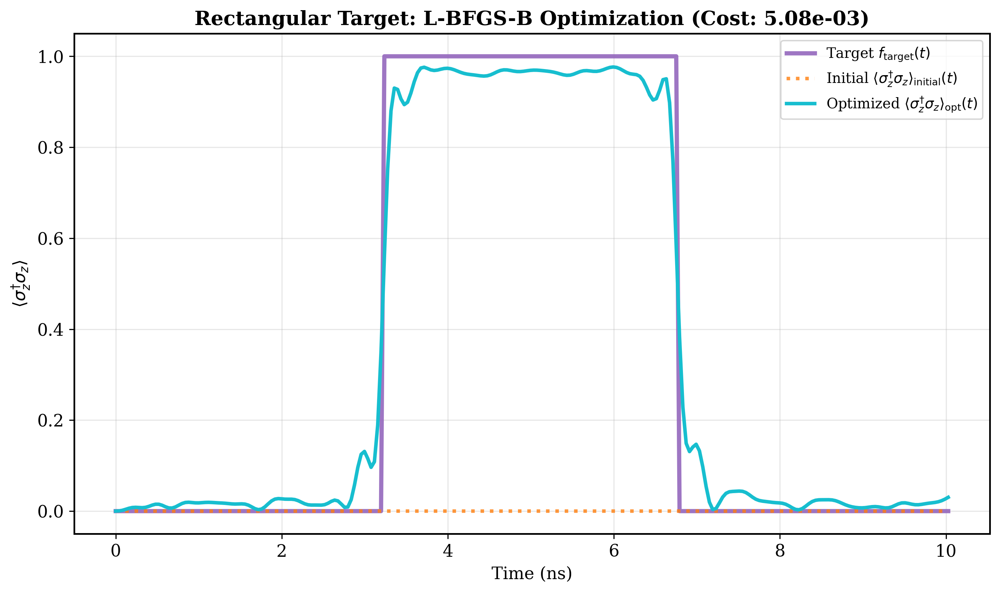

Figure saved: results/rectangular_lbfgs_control_field.png


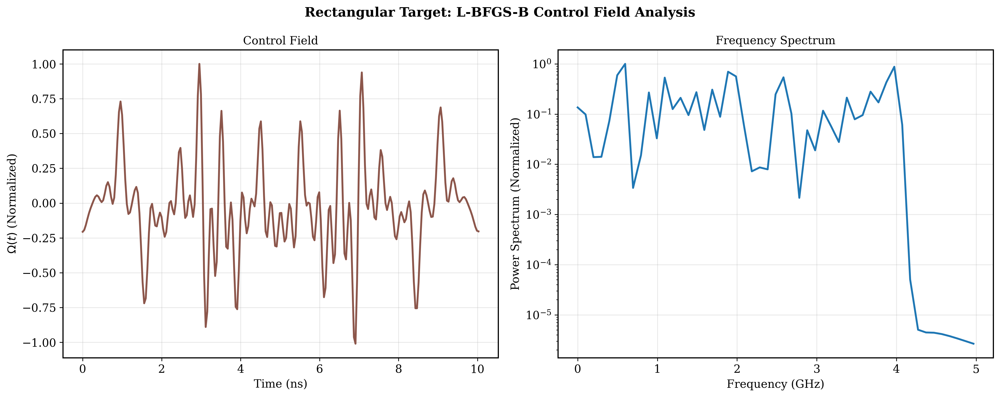

L-BFGS-B: Cost = 5.082525e-03, Time = 1058.40s


In [65]:
# Plot results for Rectangular target (L-BFGS-B only)
print("Plotting Rectangular target optimization results (L-BFGS-B)...")

# L-BFGS-B optimization plot
optimization_plotter.plot_optimization_results(
    time_points=time_array,
    initial_evolution=results['rectangular']['uncontrolled'],
    optimized_evolution=results['rectangular']['optimized'],
    target_evolution=results['rectangular']['target'],
    title=f'Rectangular Target: L-BFGS-B Optimization (Cost: {results["rectangular"]["cost"]:.2e})',
    filename='rectangular_lbfgs_optimization',
)

# L-BFGS-B control field analysis
optimization_plotter.plot_control_field_analysis(
    time_points=time_array,
    control_field=control_field_rect_lbfgs,
    title='Rectangular Target: L-BFGS-B Control Field Analysis',
    filename='rectangular_lbfgs_control_field',
)

print(f"L-BFGS-B: Cost = {results['rectangular']['cost']:.6e}, Time = {results['rectangular']['time']:.2f}s")

In [ ]:
# np.savez('data/rectangular_optimized5.08e-3.npz', optimized_field=optimal_coefficients_rect)

In [69]:
initial_guess_rect = np.load('data/rectangular_prediction.npz')['prediction_physical'][0]
initial_guess_rect.shape

(32,)

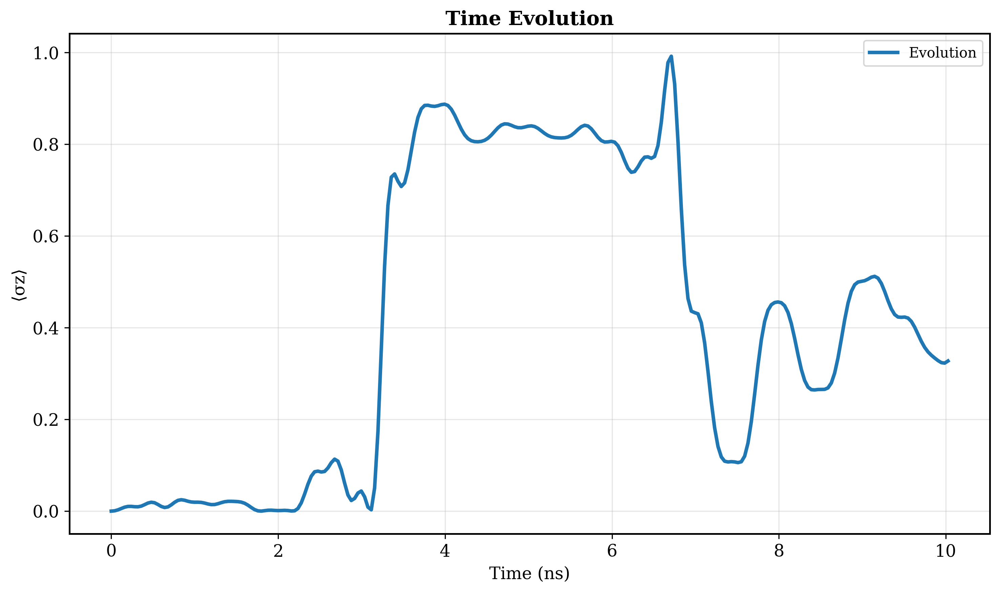

In [70]:
f = 1.0

guess_result = simulate_controlled_evolution(
    time_array, f*initial_guess_rect,
    time_array[-1],
    system_params=system_params,
    initial_state=initial_state,
    collapse_ops=collapse_ops
)

plotter_guess = QuantumControlPlotter(show_plots=True, use_latex=False, figure_format='png')

plotter_guess.plot_time_evolution(time_array,
                            guess_result['expect'][-1], ylabel='⟨σz⟩')


In [71]:
# Rectangular Target Optimization with Neural Network Initial Guess
start_time = time.time()

# Optimize for Rectangular target with L-BFGS-B with Neural Network initial guess
rectangular_result_NN = optimize_rectangular_target(
    system_params=system_params,
    pulse_fraction=0.35,  # 35% duty cycle
    fourier_modes=16,
    max_iterations=6,
    collapse_ops=collapse_ops,
    initial_guess=initial_guess_rect
)

optimization_time_rect_NN = time.time() - start_time

# Extract results
optimal_coefficients_rect_NN = rectangular_result_NN['optimization_result'].x
final_cost_rect_NN = rectangular_result_NN['optimization_result'].fun
target_evolution_rect_NN = rectangular_result_NN['target_evolution']
total_nfev_rect_NN = rectangular_result_NN['nfev']

print(f"L-BFGS-B_NN optimization completed. Best cost: {final_cost_rect_NN:.6e}")
print(f"Optimization success: {rectangular_result_NN['optimization_result'].success}")
print(f"Function evaluations: {total_nfev_rect_NN}")
print(f"Total function evaluations (nfev): {total_nfev_rect_NN}")

# Simulate optimized evolution (LBFGS)
optimized_result_rect_NN = simulate_controlled_evolution(
    time_array,
    fourier_coefficients=optimal_coefficients_rect_NN,
    drive_period=rectangular_result_NN['control_period'],
    system_params=system_params,
    initial_state=initial_state,
    collapse_ops=collapse_ops
)

# Use excitation probability observable for Rectangular tracking
exc_prob_optimized_rect_NN = optimized_result_rect_NN['expect'][-1]

# Store L-BFGS-B results
results['rectangular_NN'] = {
    'target': target_evolution_rect_NN,
    'optimized': exc_prob_optimized_rect_NN,
    'uncontrolled': exc_prob_uncontrolled,
    'coefficients': optimal_coefficients_rect_NN,
    'cost': final_cost_rect_NN,
    'time': optimization_time_rect_NN,
    'nfev': total_nfev_rect_NN,
    'method': 'L-BFGS-B_NN',
}

print(f"L-BFGS-B_NN Target tracking accuracy: {1-final_cost_rect_NN:.4f}")
print(f"L-BFGS-B_NN Optimization completed in {optimization_time_rect_NN:.2f} seconds")

control_period_rect = rectangular_result_NN['control_period']
drive_freq = float(QUBIT_FREQUENCY)

# Include drive frequency for consistency with sinusoidal section
control_field_rect_lbfgs_NN = compute_fourier_control_field(
    time_array, optimal_coefficients_rect_NN, control_period_rect, drive_freq
)

Starting optimization with provided initial guess...
Parameter space dimension: 32
Optimization method: L-BFGS-B
Variable bounds: (-2.0, 2.0)
------------------------------------------------------------
Cost = 5.079640e-03
------------------------------------------------------------
Optimization completed. Best cost: 5.079640e-03
Optimization success: True
Function evaluations: 2739
L-BFGS-B_NN optimization completed. Best cost: 5.079640e-03
Optimization success: True
Function evaluations: 2739
Total function evaluations (nfev): 2739
L-BFGS-B_NN Target tracking accuracy: 0.9949
L-BFGS-B_NN Optimization completed in 77.19 seconds


Plotting Rectangular target optimization results (L-BFGS-B_NN)...
Figure saved: results/rectangular_lbfgs_nn_optimization.png


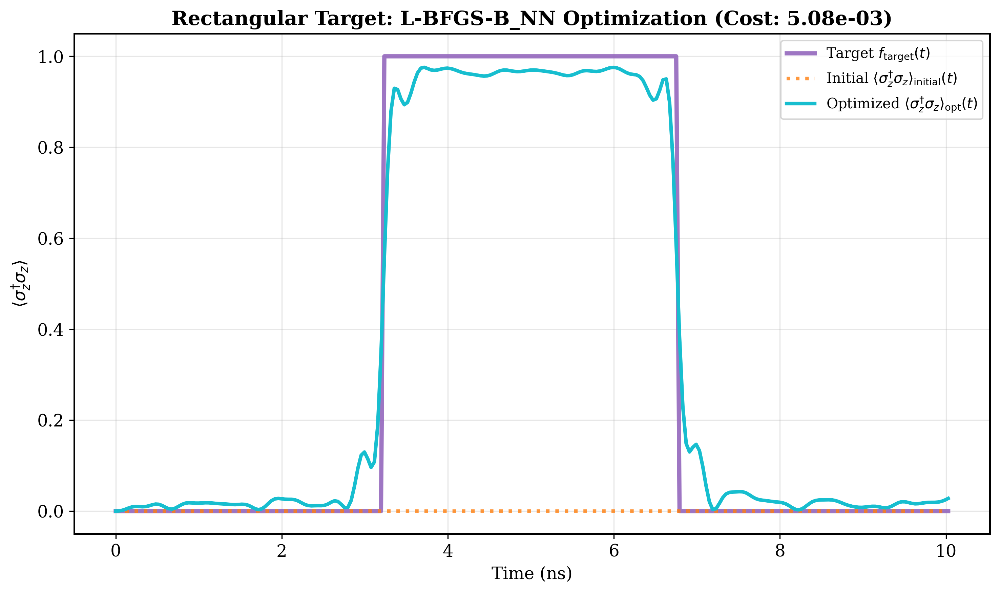

Figure saved: results/rectangular_lbfgs_nn_control_field.png


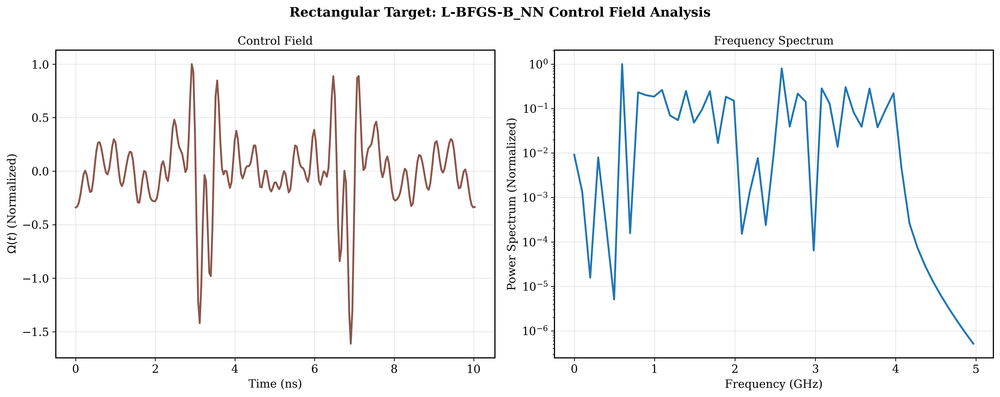

L-BFGS-B_NN: Cost = 5.079640e-03, Time = 77.19s


In [72]:
# Plot results for Rectangular target (L-BFGS-B_NN)
print("Plotting Rectangular target optimization results (L-BFGS-B_NN)...")

# L-BFGS-B_NN optimization plot
optimization_plotter.plot_optimization_results(
    time_points=time_array,
    initial_evolution=results['rectangular_NN']['uncontrolled'],
    optimized_evolution=results['rectangular_NN']['optimized'],
    target_evolution=results['rectangular_NN']['target'],
    title=f'Rectangular Target: L-BFGS-B_NN Optimization (Cost: {results["rectangular_NN"]["cost"]:.2e})',
    filename='rectangular_lbfgs_nn_optimization',
)

# L-BFGS-B_NN control field analysis
optimization_plotter.plot_control_field_analysis(
    time_points=time_array,
    control_field=control_field_rect_lbfgs_NN,
    title='Rectangular Target: L-BFGS-B_NN Control Field Analysis',
    filename='rectangular_lbfgs_nn_control_field',
)

print(f"L-BFGS-B_NN: Cost = {results['rectangular_NN']['cost']:.6e}, Time = {results['rectangular_NN']['time']:.2f}s")

In [77]:
# Now run with Nelder-Mead for comparison (Rectangular)
print("\n--- Running Nelder-Mead comparison (Rectangular) ---")
start_time_rect_nm = time.time()

# Run Nelder-Mead optimization
optimization_result_rect_nm = optimize_rectangular_target(
    system_params=system_params,
    pulse_fraction=0.35,  # 35% duty cycle
    fourier_modes=16,
    max_iterations=6,
    optimization_method='Nelder-Mead',
    collapse_ops=collapse_ops,
    initial_guess=None
)

optimization_time_rect_nm = time.time() - start_time_rect_nm

# Simulate Nelder-Mead optimized evolution (IQ-based)
optimal_coefficients_rect_nm = optimization_result_rect_nm['optimization_result'].x
final_cost_rect_nm = optimization_result_rect_nm['optimization_result'].fun
target_evolution_rect_nm = optimization_result_rect_nm['target_evolution']
total_nfev_rect_nm = optimization_result_rect_nm['nfev']

print(f"Nelder-Mead optimization completed. Best cost: {final_cost_rect_nm:.6e}")
print(f"Optimization success: {optimization_result_rect_nm['optimization_result'].success}")
print(f"Function evaluations: {optimization_result_rect_nm['optimization_result'].nfev}")
print(f"Total function evaluations (nfev): {optimization_result_rect_nm['nfev']}")

optimized_result_rect_nm = simulate_controlled_evolution(
    time_array,
    fourier_coefficients=optimal_coefficients_rect_nm,
    drive_period=optimization_result_rect_nm['control_period'],
    system_params=system_params,
    initial_state=initial_state,
    collapse_ops=collapse_ops
)

# Use excitation probability for Rectangular tracking
exc_prob_optimized_rect_nm = optimized_result_rect_nm['expect'][-1]

# Store Nelder-Mead results
results['rectangular_nm'] = {
    'target': target_evolution_rect_nm,
    'optimized': exc_prob_optimized_rect_nm,
    'uncontrolled': exc_prob_uncontrolled,
    'coefficients': optimal_coefficients_rect_nm,
    'cost': final_cost_rect_nm,
    'time': optimization_time_rect_nm,
    'nfev': total_nfev_rect_nm,
    'method': 'Nelder-Mead',
}

print(f"Nelder-Mead Target tracking accuracy: {1 - final_cost_rect_nm:.4f}")
print(f"Nelder-Mead Optimization completed in {optimization_time_rect_nm:.2f} seconds")

# NM control field (Rectangular)
control_field_rect_nm = compute_fourier_control_field(
    time_array, optimal_coefficients_rect_nm, control_period_rect, drive_freq
)


--- Running Nelder-Mead comparison (Rectangular) ---
Starting global optimization with 6 random initializations...
Parameter space dimension: 32
Optimization method: Nelder-Mead
Variable bounds: (-2.0, 2.0)
------------------------------------------------------------
Iteration 1: Parameters = 32, Cost = 1.878532e-02
Iteration 2: Parameters = 32, Cost = 1.451392e-02
  → New best solution found!
Iteration 3: Parameters = 32, Cost = 7.258560e-03
  → New best solution found!
Iteration 4: Parameters = 32, Cost = 3.805760e-02
Iteration 5: Parameters = 32, Cost = 3.397666e-02
Iteration 6: Parameters = 32, Cost = 6.972877e-03
  → New best solution found!
------------------------------------------------------------
Optimization completed. Best cost: 6.972877e-03
Optimization success: False
Function evaluations: 6400
Nelder-Mead optimization completed. Best cost: 6.972877e-03
Optimization success: False
Function evaluations: 6400
Total function evaluations (nfev): 38400
Nelder-Mead Target track

Plotting Rectangular target optimization results (Nelder-Mead)...
Figure saved: results/rectangular_nm_optimization.png


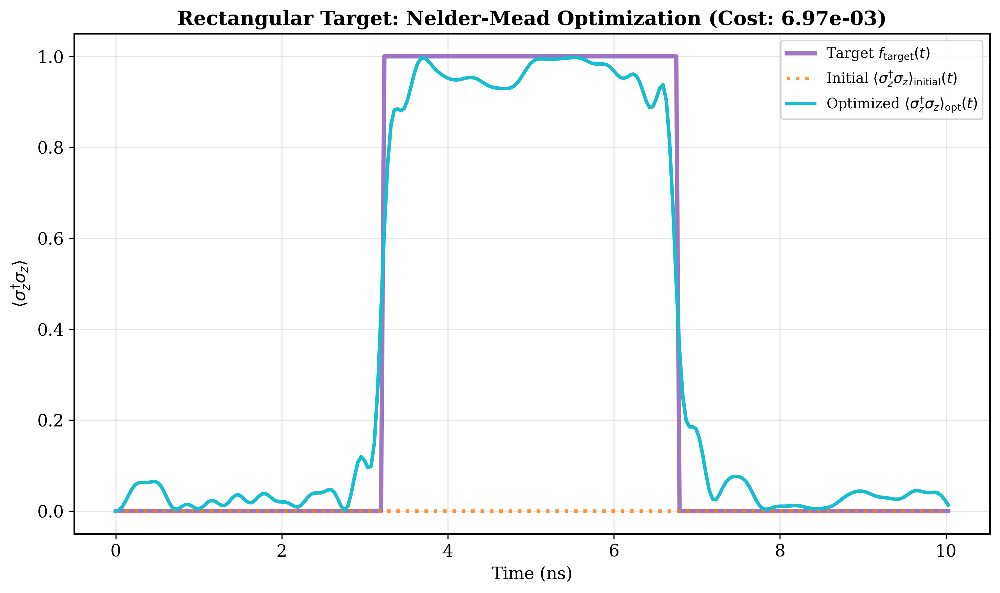

Figure saved: results/rectangular_nm_control_field.png


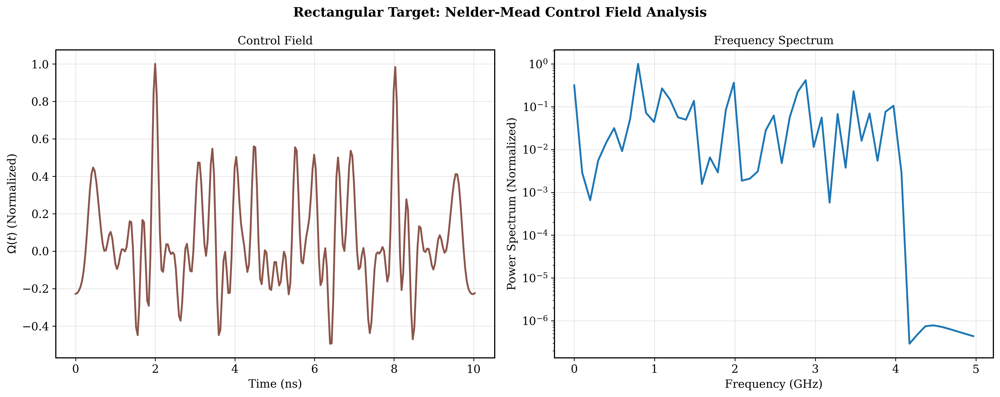

Nelder-Mead: Cost = 6.972877e-03, Time = 1079.24s


In [78]:
# Plot results for Rectangular target (Nelder-Mead)
print("Plotting Rectangular target optimization results (Nelder-Mead)...")

optimization_plotter.plot_optimization_results(
    time_points=time_array,
    initial_evolution=results['rectangular_nm']['uncontrolled'],
    optimized_evolution=results['rectangular_nm']['optimized'],
    target_evolution=results['rectangular_nm']['target'],
    title=f'Rectangular Target: Nelder-Mead Optimization (Cost: {results["rectangular_nm"]["cost"]:.2e})',
    filename='rectangular_nm_optimization',
)

optimization_plotter.plot_control_field_analysis(
    time_points=time_array,
    control_field=control_field_rect_nm,
    title='Rectangular Target: Nelder-Mead Control Field Analysis',
    filename='rectangular_nm_control_field',
)

print(f"Nelder-Mead: Cost = {results['rectangular_nm']['cost']:.6e}, Time = {results['rectangular_nm']['time']:.2f}s")

In [79]:
# Now run with Nelder-Mead with Neural Network initial guess for comparison (Rectangular)
print("\n--- Running Nelder-Mead comparison (Rectangular) ---")
start_time_rect_nm_NN = time.time()

# Run Nelder-Mead optimization with Neural Network initial guess
optimization_result_rect_nm_NN = optimize_rectangular_target(
    system_params=system_params,
    pulse_fraction=0.35,  # 35% duty cycle
    fourier_modes=16,
    max_iterations=6,
    optimization_method='Nelder-Mead',
    collapse_ops=collapse_ops,
    initial_guess=initial_guess_rect
)

optimization_time_rect_nm_NN = time.time() - start_time_rect_nm_NN

# Simulate Nelder-Mead optimized evolution (IQ-based)
optimal_coefficients_rect_nm_NN = optimization_result_rect_nm_NN['optimization_result'].x
final_cost_rect_nm_NN = optimization_result_rect_nm_NN['optimization_result'].fun
target_evolution_rect_nm_NN = optimization_result_rect_nm_NN['target_evolution']
total_nfev_rect_nm_NN = optimization_result_rect_nm_NN['nfev']

print(f"Nelder-Mead optimization completed. Best cost: {final_cost_rect_nm_NN:.6e}")
print(f"Optimization success: {optimization_result_rect_nm_NN['optimization_result'].success}")
print(f"Function evaluations: {optimization_result_rect_nm_NN['optimization_result'].nfev}")
print(f"Total function evaluations (nfev): {total_nfev_rect_nm_NN}")

optimized_result_rect_nm_NN = simulate_controlled_evolution(
    time_array,
    fourier_coefficients=optimal_coefficients_rect_nm_NN,
    drive_period=optimization_result_rect_nm_NN['control_period'],
    system_params=system_params,
    initial_state=initial_state,
    collapse_ops=collapse_ops
)

# Use excitation probability for Rectangular tracking
exc_prob_optimized_rect_nm_NN = optimized_result_rect_nm_NN['expect'][-1]

# Store Nelder-Mead results
results['rectangular_nm_NN'] = {
    'target': target_evolution_rect_nm_NN,
    'optimized': exc_prob_optimized_rect_nm_NN,
    'uncontrolled': exc_prob_uncontrolled,
    'coefficients': optimal_coefficients_rect_nm_NN,
    'cost': final_cost_rect_nm_NN,
    'time': optimization_time_rect_nm_NN,
    'nfev': total_nfev_rect_nm_NN,
    'method': 'Nelder-Mead_NN',
}

print(f"Nelder-Mead_NN Target tracking accuracy: {1 - final_cost_rect_nm_NN:.4f}")
print(f"Nelder-Mead_NN Optimization completed in {optimization_time_rect_nm_NN:.2f} seconds")

# NM control field (Rectangular)
control_field_rect_nm_NN = compute_fourier_control_field(
    time_array, optimal_coefficients_rect_nm_NN, control_period_rect, drive_freq
)


--- Running Nelder-Mead comparison (Rectangular) ---
Starting optimization with provided initial guess...
Parameter space dimension: 32
Optimization method: Nelder-Mead
Variable bounds: (-2.0, 2.0)
------------------------------------------------------------
Cost = 5.102227e-03
------------------------------------------------------------
Optimization completed. Best cost: 5.102227e-03
Optimization success: False
Function evaluations: 6400
Nelder-Mead optimization completed. Best cost: 5.102227e-03
Optimization success: False
Function evaluations: 6400
Total function evaluations (nfev): 6400
Nelder-Mead_NN Target tracking accuracy: 0.9949
Nelder-Mead_NN Optimization completed in 169.65 seconds


Plotting Rectangular target optimization results (Nelder-Mead_NN)...
Figure saved: results/rectangular_nm_NN_optimization.png


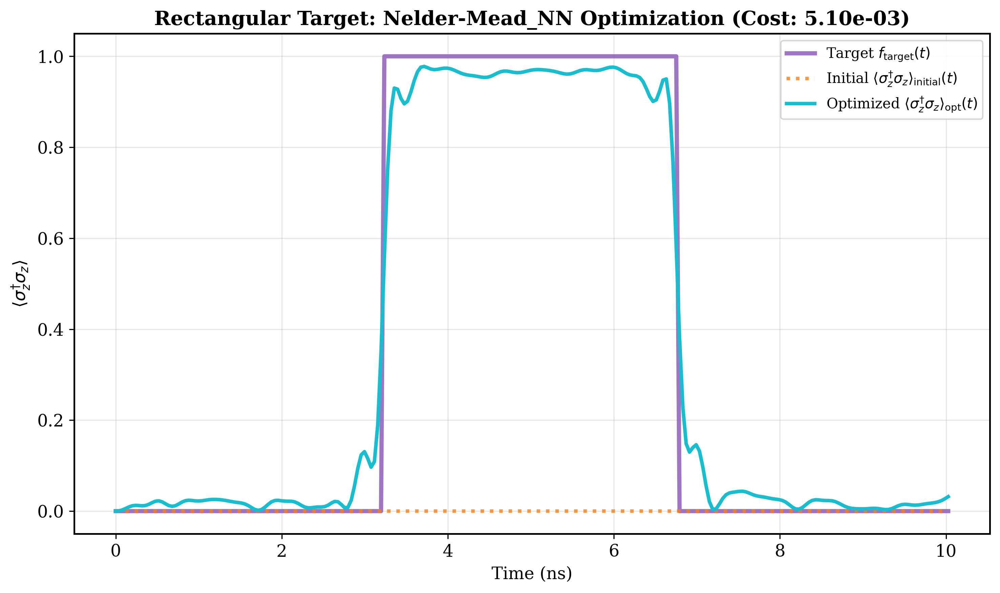

Figure saved: results/rectangular_nm_NN_control_field.png


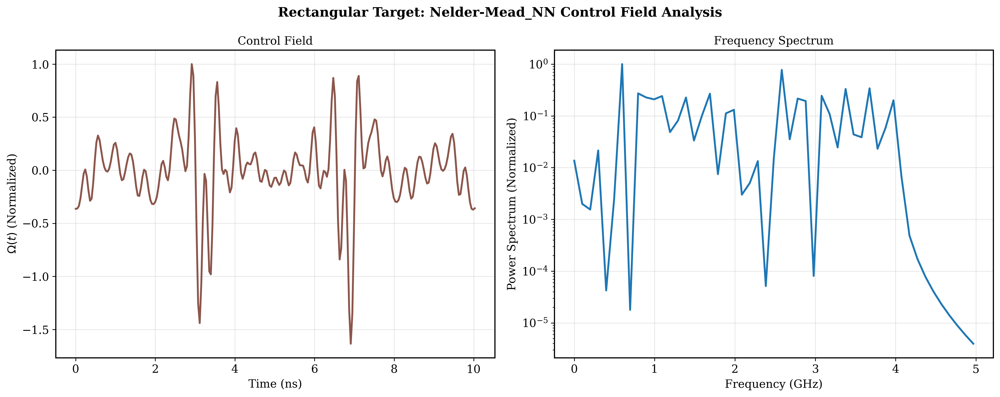

Nelder-Mead_NN: Cost = 5.102227e-03, Time = 169.65s


In [81]:
# Plot results for Rectangular target (Nelder-Mead_NN)
print("Plotting Rectangular target optimization results (Nelder-Mead_NN)...")

optimization_plotter.plot_optimization_results(
    time_points=time_array,
    initial_evolution=results['rectangular_nm_NN']['uncontrolled'],
    optimized_evolution=results['rectangular_nm_NN']['optimized'],
    target_evolution=results['rectangular_nm_NN']['target'],
    title=f'Rectangular Target: Nelder-Mead_NN Optimization (Cost: {results["rectangular_nm_NN"]["cost"]:.2e})',
    filename='rectangular_nm_NN_optimization',
)

optimization_plotter.plot_control_field_analysis(
    time_points=time_array,
    control_field=control_field_rect_nm_NN,
    title='Rectangular Target: Nelder-Mead_NN Control Field Analysis',
    filename='rectangular_nm_NN_control_field',
)

print(f"Nelder-Mead_NN: Cost = {results['rectangular_nm_NN']['cost']:.6e}, Time = {results['rectangular_nm_NN']['time']:.2f}s")

Figure saved: results/rectangular_method_comparison.png


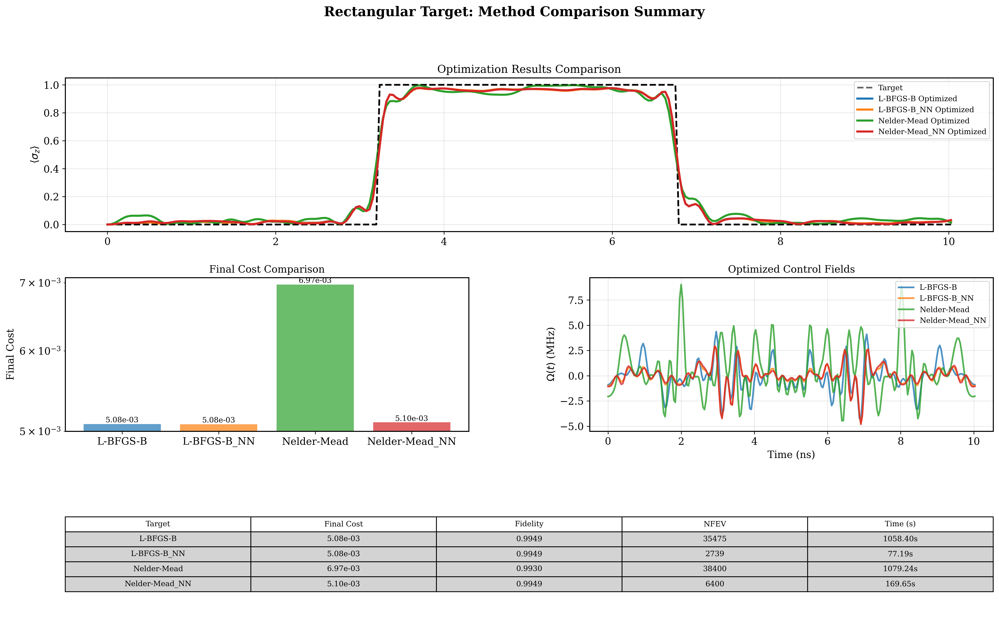

Figure saved: results/rectangular_multi_target_comparison.png


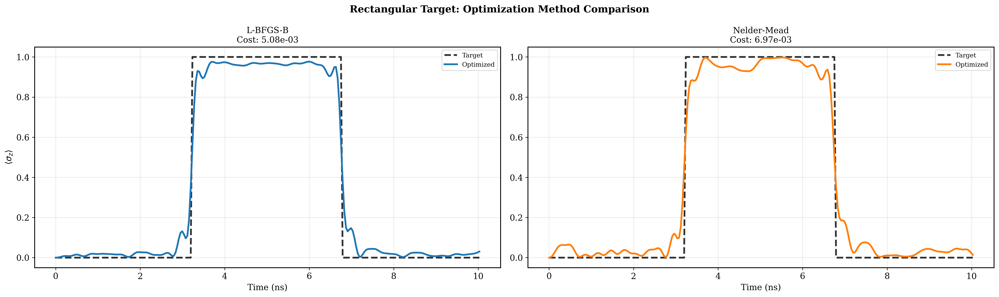


Rectangular Target - Method Comparison:
L-BFGS-B:    Cost = 5.082525e-03, Time = 1058.40s
Nelder-Mead: Cost = 6.972877e-03, Time = 1079.24s
Cost improvement ratio: 0.73


In [82]:
# Rectangular Target - Method comparison summary
rect_comparison_data = {
    'L-BFGS-B': {
        'target': results['rectangular']['target'],
        'optimized': results['rectangular']['optimized'],
        'final_cost': results['rectangular']['cost'],
        'optimization_time': results['rectangular']['time'],
        'nfev': results['rectangular']['nfev'],
        'control_field': control_field_rect_lbfgs,
    },
    'L-BFGS-B_NN': {
        'target': results['rectangular_NN']['target'],
        'optimized': results['rectangular_NN']['optimized'],
        'final_cost': results['rectangular_NN']['cost'],
        'optimization_time': results['rectangular_NN']['time'],
        'nfev': results['rectangular_NN']['nfev'],
        'control_field': control_field_rect_lbfgs_NN,
    },
    'Nelder-Mead': {
        'target': results['rectangular_nm']['target'],
        'optimized': results['rectangular_nm']['optimized'],
        'final_cost': results['rectangular_nm']['cost'],
        'optimization_time': results['rectangular_nm']['time'],
        'nfev': results['rectangular_nm']['nfev'],
        'control_field': control_field_rect_nm,
    },
    'Nelder-Mead_NN': {
        'target': results['rectangular_nm_NN']['target'],
        'optimized': results['rectangular_nm_NN']['optimized'],
        'final_cost': results['rectangular_nm_NN']['cost'],
        'optimization_time': results['rectangular_nm_NN']['time'],
        'nfev': results['rectangular_nm_NN']['nfev'],
        'control_field': control_field_rect_nm_NN,
}
}

optimization_plotter.create_summary_figure(
    time_points=time_array,
    results_data=rect_comparison_data,
    title='Rectangular Target: Method Comparison Summary',
    filename='rectangular_method_comparison',
)

optimization_plotter.plot_multi_target_comparison(
    time_points=time_array,
    target_data={'L-BFGS-B': results['rectangular']['target'], 'Nelder-Mead': results['rectangular_nm']['target']},
    optimized_data={'L-BFGS-B': results['rectangular']['optimized'], 'Nelder-Mead': results['rectangular_nm']['optimized']},
    cost_values={'L-BFGS-B': results['rectangular']['cost'], 'Nelder-Mead': results['rectangular_nm']['cost']},
    title='Rectangular Target: Optimization Method Comparison',
    filename='rectangular_multi_target_comparison',
)

print("\nRectangular Target - Method Comparison:")
print(f"L-BFGS-B:    Cost = {results['rectangular']['cost']:.6e}, Time = {results['rectangular']['time']:.2f}s")
print(f"Nelder-Mead: Cost = {results['rectangular_nm']['cost']:.6e}, Time = {results['rectangular_nm']['time']:.2f}s")
print(f"Cost improvement ratio: {results['rectangular']['cost']/results['rectangular_nm']['cost']:.2f}")

In [83]:
# Comprehensive Results Analysis
print("\n" + "="*60)
print("OPTIMIZATION CAMPAIGN SUMMARY")
print("="*60)

# Calculate additional metrics for all results
for name, result in results.items():
    # Calculate fidelity (1 - cost)
    result['fidelity'] = 1 - result['cost']
    
    # Calculate RMS error
    rms_error = np.sqrt(np.mean((result['target'] - result['optimized'])**2))
    result['rms_error'] = rms_error
    
    # Count active Fourier modes (non-zero coefficients)
    active_modes = np.sum(np.abs(result['coefficients']) > 1e-6)
    result['active_modes'] = active_modes
    
    # Calculate control field metrics if available
    if 'control_fields' in result:
        if 'field' in result['control_fields']:  # Complex field (Gaussian, Rectangular)
            field = result['control_fields']['field']
            result['max_field_amplitude'] = np.max(np.abs(field))
            result['avg_field_amplitude'] = np.mean(np.abs(field))
            result['field_energy'] = np.trapz(np.abs(field)**2, time_array)
        elif 'lab_frame_field' in result['control_fields']:  # IQ field (Sinusoidal)
            lab_field = result['control_fields']['lab_frame_field']
            result['max_field_amplitude'] = np.max(np.abs(lab_field))
            result['avg_field_amplitude'] = np.mean(np.abs(lab_field))
            result['field_energy'] = np.trapz(lab_field**2, time_array)

# Print summary table
print(f"{'Target':<15} {'Method':<12} {'Fidelity':<10} {'Cost':<12} {'RMS Error':<12} {'Time (s)':<10} {'Active Modes':<12}")
print("-" * 95)

# Group by target type for comparison
target_types = ['sinusoidal', 'gaussian', 'rectangular']
for target_type in target_types:
    # L-BFGS-B results
    if target_type in results:
        result = results[target_type]
        print(f"{target_type.capitalize():<15} {result['method']:<12} {result['fidelity']:<10.4f} {result['cost']:<12.6e} "
              f"{result['rms_error']:<12.6f} {result['time']:<10.2f} {result['active_modes']:<12d}")
    
    # Nelder-Mead results
    nm_key = target_type + '_nm'
    if nm_key in results:
        result = results[nm_key]
        print(f"{'':<15} {result['method']:<12} {result['fidelity']:<10.4f} {result['cost']:<12.6e} "
              f"{result['rms_error']:<12.6f} {result['time']:<10.2f} {result['active_modes']:<12d}")
    print()

# Control Field Analysis Summary
print("\n" + "="*60)
print("CONTROL FIELD ANALYSIS SUMMARY")
print("="*60)

print(f"{'Target':<15} {'Method':<12} {'Max Amplitude':<15} {'Avg Amplitude':<15} {'Field Energy':<15}")
print("-" * 75)

for target_type in target_types:
    # L-BFGS-B results
    if target_type in results and 'max_field_amplitude' in results[target_type]:
        result = results[target_type]
        print(f"{target_type.capitalize():<15} {result['method']:<12} {result['max_field_amplitude']:<15.4f} "
              f"{result['avg_field_amplitude']:<15.6f} {result['field_energy']:<15.4f}")
    
    # Nelder-Mead results
    nm_key = target_type + '_nm'
    if nm_key in results and 'max_field_amplitude' in results[nm_key]:
        result = results[nm_key]
        print(f"{'':<15} {result['method']:<12} {result['max_field_amplitude']:<15.4f} "
              f"{result['avg_field_amplitude']:<15.6f} {result['field_energy']:<15.4f}")
    print()

# Method Performance Comparison
print("\n" + "="*60)
print("METHOD PERFORMANCE COMPARISON")
print("="*60)

lbfgs_costs = []
nm_costs = []
lbfgs_times = []
nm_times = []

for target_type in target_types:
    if target_type in results:
        lbfgs_costs.append(results[target_type]['cost'])
        lbfgs_times.append(results[target_type]['time'])
    
    nm_key = target_type + '_nm'
    if nm_key in results:
        nm_costs.append(results[nm_key]['cost'])
        nm_times.append(results[nm_key]['time'])

if lbfgs_costs and nm_costs:
    print(f"Average Cost - L-BFGS-B: {np.mean(lbfgs_costs):.6e}, Nelder-Mead: {np.mean(nm_costs):.6e}")
    print(f"Average Time - L-BFGS-B: {np.mean(lbfgs_times):.2f}s, Nelder-Mead: {np.mean(nm_times):.2f}s")
    print(f"Cost Ratio (L-BFGS-B/Nelder-Mead): {np.mean(lbfgs_costs)/np.mean(nm_costs):.2f}")
    print(f"Time Ratio (L-BFGS-B/Nelder-Mead): {np.mean(lbfgs_times)/np.mean(nm_times):.2f}")


OPTIMIZATION CAMPAIGN SUMMARY
Target          Method       Fidelity   Cost         RMS Error    Time (s)   Active Modes
-----------------------------------------------------------------------------------------------
Sinusoidal      L-BFGS-B     0.9993     6.784016e-04 0.026046     1719.19    32          
                Nelder-Mead  0.9987     1.325949e-03 0.036414     1097.06    32          

Gaussian        L-BFGS-B     0.9997     2.748718e-04 0.016579     422.08     32          
                Nelder-Mead  0.9997     2.624267e-04 0.016200     1049.31    32          

Rectangular     L-BFGS-B     0.9949     5.082525e-03 0.071292     1058.40    32          
                Nelder-Mead  0.9930     6.972877e-03 0.083504     1079.24    32          


CONTROL FIELD ANALYSIS SUMMARY
Target          Method       Max Amplitude   Avg Amplitude   Field Energy   
---------------------------------------------------------------------------




METHOD PERFORMANCE COMPARISON
Average Cost - L-BFGS

Creating comprehensive optimization campaign visualization and summary...
Figure saved: results/complete_optimization_campaign.png


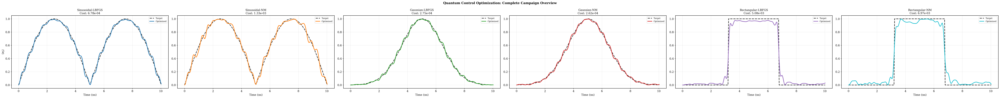

,target,method,cost,fidelity,rms_error,nfev,time_s,active_modes,max90_field_amp,avg_field_amp,field_energy,best_by_cost
0,gaussian,L-BFGS-B,0.000275,0.999725,0.016579,15444,422.078580,32,NaN,NaN,NaN,False
1,gaussian,Nelder-Mead,0.000262,0.999738,0.016200,38400,1049.311898,32,NaN,NaN,NaN,True
2,gaussian_NN,L-BFGS-B_NN,0.000202,0.999798,0.014223,1914,55.831542,32,NaN,NaN,NaN,True
3,gaussian_NN,Nelder-Mead_NN,0.000204,0.999796,0.014276,6400,186.069765,32,NaN,NaN,NaN,False
4,rectangular,L-BFGS-B,0.005083,0.994917,0.071292,35475,1058.396500,32,NaN,NaN,NaN,True
5,rectangular,Nelder-Mead,0.006973,0.993027,0.083504,38400,1079.237345,32,NaN,NaN,NaN,False
6,rectangular_NN,L-BFGS-B_NN,0.005080,0.994920,0.071272,2739,77.191086,32,NaN,NaN,NaN,True
7,rectangular_NN,Nelder-Mead_NN,0.005102,0.994898,0.071430,6400,169.654383,32,NaN,NaN,NaN,False
8,sinusoidal,L-BFGS-B,0.000678,0.999322,0.026046,61017,1719.190332,32,NaN,NaN,NaN,True
9,sinusoidal,Nelder-Mead,0.001326,0.998674,0.036414,38400,1097.059991,32,NaN,NaN,NaN,False


,cost_lbfgs,cost_nm,cost_ratio_lbfgs_to_nm,time_lbfgs_s,time_nm_s,time_ratio_lbfgs_to_nm,fidelity_lbfgs,fidelity_nm,rms_lbfgs,rms_nm,modes_lbfgs,modes_nm,best_method_by_cost
target,,,,,,,,,,,,,
gaussian,0.000275,0.000262,1.047423,422.078580,1049.311898,0.402243,0.999725,0.999738,0.016579,0.016200,32.0,32.0,Nelder-Mead
gaussian_NN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
rectangular,0.005083,0.006973,0.728899,1058.396500,1079.237345,0.980689,0.994917,0.993027,0.071292,0.083504,32.0,32.0,L-BFGS-B
rectangular_NN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sinusoidal,0.000678,0.001326,0.511635,1719.190332,1097.059991,1.567089,0.999322,0.998674,0.026046,0.036414,32.0,32.0,L-BFGS-B
sinusoidal_L-BFGS-B_NN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sinusoidal_NN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Summary tables created. Figures saved to results directory.


In [85]:
# Comprehensive Visualization and Organized Summary

print("Creating comprehensive optimization campaign visualization and summary...")

# Prepare data for multi-target comparison (all targets, all methods)
all_targets_data = {}
all_optimized_data = {}
all_cost_data = {}

target_types = ['sinusoidal', 'gaussian', 'rectangular']
methods = ['', '_nm']  # L-BFGS-B and Nelder-Mead

for target_type in target_types:
    for method in methods:
        key = target_type + method
        if key in results:
            display_name = f"{target_type.capitalize()}-{'LBFGS' if method == '' else 'NM'}"
            all_targets_data[display_name] = results[key]['target']
            all_optimized_data[display_name] = results[key]['optimized']
            all_cost_data[display_name] = results[key]['cost']

# Create comprehensive multi-target comparison figure
optimization_plotter.plot_multi_target_comparison(
    time_points=time_array,
    target_data=all_targets_data,
    optimized_data=all_optimized_data,
    cost_values=all_cost_data,
    title='Quantum Control Optimization: Complete Campaign Overview',
    filename='complete_optimization_campaign',
)

# ===============================
# Organized Summary (Pandas)
# ===============================
# Build per-target/per-method summary from `results`
summary_rows = []
for name, data in results.items():
    target_type = name.replace('_nm', '')
    method = data.get('method', 'Unknown')
    summary_rows.append({
        'target': target_type,
        'method': method,
        'cost': data.get('cost', np.nan),
        'fidelity': data.get('fidelity', 1 - data.get('cost', np.nan)),
        'rms_error': data.get('rms_error', np.nan),
        'nfev': data.get('nfev', np.nan),
        'time_s': data.get('time', np.nan),
        'active_modes': data.get('active_modes', np.nan),
        'max90_field_amp': data.get('max90_field_amplitude', np.nan),
        'avg_field_amp': data.get('avg_field_amplitude', np.nan),
        'field_energy': data.get('field_energy', np.nan),
    })

summary_df = pd.DataFrame(summary_rows)
if not summary_df.empty:
    # Identify the best method per target (lowest cost)
    idx_best = summary_df.groupby('target')['cost'].idxmin()
    summary_df['best_by_cost'] = False
    summary_df.loc[idx_best, 'best_by_cost'] = True
    
    # Order and pretty formatting
    summary_df = summary_df.sort_values(['target', 'method']).reset_index(drop=True)
    display(summary_df)
else:
    print("No results to summarize.")

# Side-by-side comparison per target with deltas between methods
comp_rows = []
for tgt in sorted(set(summary_df['target'])) if not summary_df.empty else []:
    sub = summary_df[summary_df['target'] == tgt].set_index('method')
    row = {'target': tgt}
    # Extract metrics for both methods if present
    if 'L-BFGS-B' in sub.index:
        row.update({
            'cost_lbfgs': sub.at['L-BFGS-B', 'cost'],
            'time_lbfgs_s': sub.at['L-BFGS-B', 'time_s'],
            'fidelity_lbfgs': sub.at['L-BFGS-B', 'fidelity'],
            'rms_lbfgs': sub.at['L-BFGS-B', 'rms_error'],
            'modes_lbfgs': sub.at['L-BFGS-B', 'active_modes'],
        })
    if 'Nelder-Mead' in sub.index:
        row.update({
            'cost_nm': sub.at['Nelder-Mead', 'cost'],
            'time_nm_s': sub.at['Nelder-Mead', 'time_s'],
            'fidelity_nm': sub.at['Nelder-Mead', 'fidelity'],
            'rms_nm': sub.at['Nelder-Mead', 'rms_error'],
            'modes_nm': sub.at['Nelder-Mead', 'active_modes'],
        })
    # Derived ratios (guard against zero/NaN)
    c_lb = row.get('cost_lbfgs', np.nan)
    c_nm = row.get('cost_nm', np.nan)
    t_lb = row.get('time_lbfgs_s', np.nan)
    t_nm = row.get('time_nm_s', np.nan)
    row['cost_ratio_lbfgs_to_nm'] = (c_lb / c_nm) if (np.isfinite(c_lb) and np.isfinite(c_nm) and c_nm != 0) else np.nan
    row['time_ratio_lbfgs_to_nm'] = (t_lb / t_nm) if (np.isfinite(t_lb) and np.isfinite(t_nm) and t_nm != 0) else np.nan
    if np.isfinite(c_lb) and np.isfinite(c_nm):
        row['best_method_by_cost'] = 'L-BFGS-B' if c_lb < c_nm else 'Nelder-Mead'
    comp_rows.append(row)

if comp_rows:
    comp_df = pd.DataFrame(comp_rows).set_index('target')
    # Order columns for readability
    ordered_cols = [
        'cost_lbfgs', 'cost_nm', 'cost_ratio_lbfgs_to_nm',
        'time_lbfgs_s', 'time_nm_s', 'time_ratio_lbfgs_to_nm',
        'fidelity_lbfgs', 'fidelity_nm',
        'rms_lbfgs', 'rms_nm',
        'modes_lbfgs', 'modes_nm',
        'best_method_by_cost',
    ]
    comp_df = comp_df.reindex(columns=[c for c in ordered_cols if c in comp_df.columns])
    display(comp_df)
else:
    print("Method comparison: insufficient data to compare.")

print("Summary tables created. Figures saved to results directory.")